# **Forgery Detection — Multi-Source (Binary: Real vs AI-Generated)**

Pooled binary classifier trained on multiple AI-generator sources:
- **Defactify** (SD2.1, SDXL, SD3, DALL-E-3, MidJourney v6 + real)
- **bitmind/nano-banana** (Gemini Nano-Banana — fake only)
- **Scam-AI/gpt-image-2** (ChatGPT / GPT-Image-2 — fake only, self-reported provenance, CC-BY-NC-SA-4.0)

All sources pooled into one binary classifier (real vs ai_generated). Evaluation reports **per-generator accuracy** so blind spots (e.g. good on SD/DALL-E, weak on Gemini/ChatGPT) are visible rather than hidden inside one overall accuracy number.

**Open items carried into this notebook (not yet resolved):**
- `Scam-AI/gpt-image-2` is GPT-Image **2**, not GPT-Image **1** — version mismatch risk if client's real failure case is GPT-Image-1.
- Both `bitmind/nano-banana` (MIT) and `Scam-AI/gpt-image-2` (CC-BY-NC-SA-4.0, non-commercial) need a license/compliance sign-off before any commercial deployment — NC license on `Scam-AI/gpt-image-2` is the one with real legal weight.
- Threshold for real-vs-AI is still hardcoded at 0.50 in `predict()` — unvalidated against precision/recall tradeoffs.

In [ ]:
!pip install timm scikit-learn datasets huggingface_hub --quiet

**Load Defactify dataset**

In [ ]:
from datasets import load_dataset
from huggingface_hub import login
# from google.colab import userdata
# login(token=userdata.get('HF_TOKEN'))  # uncomment if dataset requires auth

ai_df = load_dataset(
    "Rajarshi-Roy-research/Defactify_Image_Dataset",
    split="train"
)  # ~42k images available

print(ai_df)
print(ai_df[0])

README.md:   0%|          | 0.00/5.11k [00:00<?, ?B/s]

data/validation-00000-of-00002.parquet:   0%|          | 0.00/333M [00:00<?, ?B/s]

data/validation-00001-of-00002.parquet:   0%|          | 0.00/345M [00:00<?, ?B/s]

data/train-00000-of-00007.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/train-00001-of-00007.parquet:   0%|          | 0.00/445M [00:00<?, ?B/s]

data/train-00002-of-00007.parquet:   0%|          | 0.00/450M [00:00<?, ?B/s]

data/train-00003-of-00007.parquet:   0%|          | 0.00/456M [00:00<?, ?B/s]

data/train-00004-of-00007.parquet:   0%|          | 0.00/459M [00:00<?, ?B/s]

data/train-00005-of-00007.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

data/train-00006-of-00007.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/test-00000-of-00008.parquet:   0%|          | 0.00/318M [00:00<?, ?B/s]

data/test-00001-of-00008.parquet:   0%|          | 0.00/462M [00:00<?, ?B/s]

data/test-00002-of-00008.parquet:   0%|          | 0.00/671M [00:00<?, ?B/s]

data/test-00003-of-00008.parquet:   0%|          | 0.00/477M [00:00<?, ?B/s]

data/test-00004-of-00008.parquet:   0%|          | 0.00/425M [00:00<?, ?B/s]

data/test-00005-of-00008.parquet:   0%|          | 0.00/425M [00:00<?, ?B/s]

data/test-00006-of-00008.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

data/test-00007-of-00008.parquet:   0%|          | 0.00/449M [00:00<?, ?B/s]

Generating validation split:   0%|          | 0/9000 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/42000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/45000 [00:00<?, ? examples/s]

Dataset({
    features: ['Caption', 'Image', 'Label_A', 'Label_B'],
    num_rows: 42000
})
{'Caption': 'Two tall giraffe standing next to each other on a  field.', 'Image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480 at 0x7BA81F7A7CB0>, 'Label_A': 0, 'Label_B': 0}


In [ ]:
# Sanity check labels
labels_a = [ai_df[i]['Label_A'] for i in range(100)]
print("Label_A unique:", set(labels_a))

for i in range(5):
    sample = ai_df[i]
    print(f"Sample {i}: Label_A={sample['Label_A']} Caption={sample['Caption'][:100]}")

Label_A unique: {0, 1}
Sample 0: Label_A=0 Caption=Two tall giraffe standing next to each other on a  field.
Sample 1: Label_A=1 Caption=Two tall giraffe standing next to each other on a  field.
Sample 2: Label_A=1 Caption=Two tall giraffe standing next to each other on a  field.
Sample 3: Label_A=1 Caption=Two tall giraffe standing next to each other on a  field.
Sample 4: Label_A=1 Caption=Two tall giraffe standing next to each other on a  field.


In [ ]:
import torch
print("CUDA available:", torch.cuda.is_available())

CUDA available: True


## Build master label dataframe (Defactify only)

In [ ]:
import pandas as pd
import os
from tqdm import tqdm

# ---- Folder setup for non-HF-indexed sources (Gemini, ChatGPT) ----
FOLDERS = {
    "ai_gemini":  "/content/forgery_images/ai_gemini",
    "ai_chatgpt": "/content/forgery_images/ai_chatgpt",
}
for path in FOLDERS.values():
    os.makedirs(path, exist_ok=True)

records = []

# Balance real vs ai_generated — adjust target based on how much data you want
TARGET_PER_CLASS = 2500  # per class; raise this for a larger training set

real_count = 0
ai_count   = 0
defactify_skip = 0

for i, sample in enumerate(tqdm(ai_df, desc="Defactify")):
    try:
        label = sample['Label_A']  # 0 = real, 1 = AI-generated
    except Exception:
        defactify_skip += 1
        continue

    if label == 0 and real_count < TARGET_PER_CLASS:
        records.append({
            "file_id"       : f"defactify_real_{i:05d}",
            "image_path"    : f"defactify_index_{i}",
            "is_forged"     : 0,
            "source_dataset": "DEFACTIFY",
            "generator"     : "real",
        })
        real_count += 1

    elif label == 1 and ai_count < TARGET_PER_CLASS:
        # NOTE: Defactify mixes SD2.1/SDXL/SD3/DALL-E-3/MidJourney-v6 under one label.
        # If the dataset exposes a per-row model/generator field, swap this for that —
        # check `ai_df.column_names` / `sample.keys()` to confirm before assuming this is the ceiling.
        records.append({
            "file_id"       : f"defactify_ai_{i:05d}",
            "image_path"    : f"defactify_index_{i}",
            "is_forged"     : 1,
            "source_dataset": "DEFACTIFY",
            "generator"     : "defactify_mixed",
        })
        ai_count += 1

    if real_count >= TARGET_PER_CLASS and ai_count >= TARGET_PER_CLASS:
        break

defactify_real_count = real_count  # carried forward for OpenFake/other real-quota math if reintroduced later

print(f"Defactify real added : {real_count}")
print(f"Defactify AI added   : {ai_count}")
print(f"Defactify skipped    : {defactify_skip}")

Defactify:  36%|███▌      | 14994/42000 [00:52<01:34, 284.43it/s]

Defactify real added : 2500
Defactify AI added   : 2500
Defactify skipped    : 0


**Add Gemini samples (bitmind/nano-banana)**

In [ ]:
# ---- Gemini (bitmind/nano-banana) — fake-only, no label filtering needed ----
print("Streaming bitmind/nano-banana for Gemini samples...")

GEMINI_TARGET = TARGET_PER_CLASS // 3   # adjust if rebalancing real-vs-ai quotas
gemini_count  = 0
gemini_skip   = 0

nano_stream = load_dataset("bitmind/nano-banana", split="train", streaming=True)
nano_iter   = iter(nano_stream)
pbar = tqdm(total=GEMINI_TARGET, desc="Gemini (nano-banana)")

while gemini_count < GEMINI_TARGET:
    try:
        example = next(nano_iter)
    except StopIteration:
        print(f"\nStream exhausted at {gemini_count} images (dataset smaller than target).")
        break
    except Exception:
        gemini_skip += 1
        continue

    try:
        img = example["image"].convert("RGB")
        fname = f"{FOLDERS['ai_gemini']}/{gemini_count:05d}.jpg"
        img.save(fname, "JPEG", quality=95)
        records.append({
            "file_id": f"gemini_{gemini_count:05d}", "image_path": fname,
            "is_forged": 1, "source_dataset": "NANO_BANANA", "generator": "gemini_nano_banana"
        })
        gemini_count += 1
        pbar.update(1)
    except Exception:
        gemini_skip += 1

pbar.close()
print(f"Gemini saved: {gemini_count} | skipped: {gemini_skip}")

Streaming bitmind/nano-banana for Gemini samples...


README.md:   0%|          | 0.00/1.96k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/31 [00:00<?, ?it/s]

Gemini (nano-banana): 100%|██████████| 833/833 [02:10<00:00,  6.39it/s]

Gemini saved: 833 | skipped: 0


**Add ChatGPT/GPT-Image samples (Scam-AI/gpt-image-2)**

In [ ]:
from huggingface_hub import login
from google.colab import userdata

login(token=userdata.get('HF_TOKEN'))

In [ ]:
# # ---- ChatGPT / GPT-Image (Scam-AI/gpt-image-2) ----
# # NOTE: cc-by-nc-sa-4.0 — non-commercial license. Flag before any production/commercial use.
# # NOTE: this is GPT-Image-2, NOT GPT-Image-1. If client's actual failure case is GPT-Image-1,
# # this is a generation-version mismatch — confirm with client which version before trusting this slice.
# # NOTE: provenance is self-reported (tweet text / platform AI-detection flag), not cryptographically verified.
# print("Streaming Scam-AI/gpt-image-2 for ChatGPT/GPT-Image samples...")

# CHATGPT_TARGET = TARGET_PER_CLASS // 3
# chatgpt_count  = 0
# chatgpt_skip   = 0

# gptimg_stream = load_dataset("Scam-AI/gpt-image-2", split="train", streaming=True)
# gptimg_iter   = iter(gptimg_stream)
# pbar = tqdm(total=CHATGPT_TARGET, desc="ChatGPT (gpt-image-2)")

# while chatgpt_count < CHATGPT_TARGET:
#     try:
#         example = next(gptimg_iter)
#     except StopIteration:
#         print(f"\nStream exhausted at {chatgpt_count} images.")
#         break
#     except Exception:
#         chatgpt_skip += 1
#         continue

#     try:
#         img = example["image"].convert("RGB")
#         fname = f"{FOLDERS['ai_chatgpt']}/{chatgpt_count:05d}.jpg"
#         img.save(fname, "JPEG", quality=95)
#         records.append({
#             "file_id": f"chatgpt_{chatgpt_count:05d}", "image_path": fname,
#             "is_forged": 1, "source_dataset": "GPT_IMAGE_2", "generator": "chatgpt_gpt_image"
#         })
#         chatgpt_count += 1
#         pbar.update(1)
#     except Exception:
#         chatgpt_skip += 1

# pbar.close()
# print(f"ChatGPT saved: {chatgpt_count} | skipped: {chatgpt_skip}")

In [ ]:
# ---- ChatGPT / GPT-Image (Scam-AI/gpt-image-2) — manual loading ----
# NOTE: cc-by-nc-sa-4.0 — non-commercial license. Flag before any production/commercial use.
# NOTE: this is GPT-Image-2, NOT GPT-Image-1. If client's actual failure case is GPT-Image-1,
# this is a generation-version mismatch — confirm with client which version before trusting this slice.
# NOTE: provenance is self-reported (tweet text / platform AI-detection flag), not cryptographically verified.
#
# load_dataset(...) does NOT work on this repo — confirmed via error + dataset card inspection.
# Repo structure links images via tweet_id + media_key fields inside metadata.jsonl
# (filename pattern: images/{tweet_id}_{media_key}.jpg), not a `file_name` column,
# which HF's imagefolder/folder_based_builder auto-loader requires — hence the
# "`file_name` or `*_file_name` must be present" ValueError. Loading manually instead.

import json as _json
from PIL import Image
from huggingface_hub import hf_hub_download

GPT_IMAGE_REPO = "Scam-AI/gpt-image-2"
CHATGPT_TARGET = TARGET_PER_CLASS // 3
chatgpt_count  = 0
chatgpt_skip   = 0

print("Downloading metadata.jsonl from Scam-AI/gpt-image-2...")
metadata_path = hf_hub_download(
    repo_id=GPT_IMAGE_REPO, repo_type="dataset", filename="metadata.jsonl"
)

with open(metadata_path) as f:
    gptimg_records_meta = [_json.loads(line) for line in f]

print(f"Loaded {len(gptimg_records_meta)} metadata records")

# ---- Inspect schema before trusting field names below ----
# tweet_id / media_key are confirmed by the dataset card; everything else (dataset_source,
# language, subject-matter tags, etc.) is inferred from the card's prose, not verified against
# the literal JSON. Check this printed record on first run before trusting the loop below.
print("\nSample record (verify field names before proceeding):")
print(gptimg_records_meta[0])

# ---- Download + save loop ----
# Every record in this dataset is already a confirmed GPT-Image-2 sample (no real/fake
# filtering needed, unlike the OpenFake sparse-match search) — so this just takes the
# first CHATGPT_TARGET records rather than scanning for matches.
pbar = tqdm(total=min(CHATGPT_TARGET, len(gptimg_records_meta)), desc="ChatGPT (gpt-image-2)")

for rec in gptimg_records_meta:
    if chatgpt_count >= CHATGPT_TARGET:
        break
    try:
        tweet_id  = rec["tweet_id"]
        media_key = rec["media_key"]
        remote_filename = f"images/{tweet_id}_{media_key}.jpg"

        local_path = hf_hub_download(
            repo_id=GPT_IMAGE_REPO, repo_type="dataset", filename=remote_filename
        )

        img = Image.open(local_path).convert("RGB")
        fname = f"{FOLDERS['ai_chatgpt']}/{chatgpt_count:05d}.jpg"
        img.save(fname, "JPEG", quality=95)

        records.append({
            "file_id": f"chatgpt_{chatgpt_count:05d}", "image_path": fname,
            "is_forged": 1, "source_dataset": "GPT_IMAGE_2", "generator": "chatgpt_gpt_image"
        })
        chatgpt_count += 1
        pbar.update(1)

    except Exception as e:
        chatgpt_skip += 1
        if chatgpt_skip <= 5:
            print(f"[ChatGPT loader] failed on record {rec.get('tweet_id', '?')}_{rec.get('media_key', '?')}: {e}")

pbar.close()
print(f"ChatGPT saved: {chatgpt_count} | skipped: {chatgpt_skip}")

metadata.jsonl:   0%|          | 0.00/18.2M [00:00<?, ?B/s]

Loaded 10217 metadata records

Sample record (verify field names before proceeding):
{'tweet_id': '2048133981229449304', 'tweet_url': 'https://twitter.com/i/web/status/2048133981229449304', 'text': 'Created an image in @capcutapp using GPT Image 2, prompted: "Create a one page comic book of a friendship story. Format 4:3"\n\nComic page result below. Then the video transformation👇 https://t.co/sOgRh42yYM', 'created_at': '2026-04-25T20:16:08.000Z', 'lang': 'en', 'possibly_sensitive': False, 'retweet_count': 0, 'like_count': 0, 'reply_count': 1, 'quote_count': 0, 'impression_count': 44, 'author_id': '2024892856541081601', 'author_username': 'ChangningL29508', 'author_name': 'Changning Liu', 'author_verified': False, 'author_followers': 79, 'author_following': 1, 'author_tweet_count': 365, 'author_created_at': '2026-02-20T17:04:36.000Z', 'author_description': '', 'media_key': '3_2048133948702588929', 'media_type': 'photo', 'media_width': 680, 'media_height': 381, 'media_alt_text': None, 'i

ChatGPT (gpt-image-2):   0%|          | 0/833 [00:00<?, ?it/s]

images/2048133981229449304_3_20481339487(…):   0%|          | 0.00/86.1k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   0%|          | 2/833 [00:00<05:55,  2.34it/s]

images/2048129335853559824_3_20481260763(…):   0%|          | 0.00/961k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   0%|          | 3/833 [00:02<09:53,  1.40it/s]

images/2048121503367995753_3_20481214937(…):   0%|          | 0.00/112k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   0%|          | 4/833 [00:03<12:53,  1.07it/s]

images/2048118619083767926_3_20481183085(…):   0%|          | 0.00/163k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 5/833 [00:04<16:06,  1.17s/it]

images/2048115983424840170_3_20481159660(…):   0%|          | 0.00/343k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 6/833 [00:05<14:46,  1.07s/it]

images/2048103909433201058_3_20480983159(…):   0%|          | 0.00/273k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 7/833 [00:06<13:39,  1.01it/s]

images/2048103909433201058_3_20480983159(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 8/833 [00:07<14:03,  1.02s/it]

images/2048089333727404400_3_20480893241(…):   0%|          | 0.00/181k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 9/833 [00:08<12:57,  1.06it/s]

images/2048089239460692445_3_20480892361(…):   0%|          | 0.00/883k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|          | 10/833 [00:09<12:22,  1.11it/s]

images/2048087945585057971_3_20480879413(…):   0%|          | 0.00/524k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|▏         | 11/833 [00:10<13:06,  1.05it/s]

images/2048087945585057971_3_20480879423(…):   0%|          | 0.00/472k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   1%|▏         | 12/833 [00:11<12:20,  1.11it/s]

images/2048081039252132051_3_20480810141(…):   0%|          | 0.00/273k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 13/833 [00:12<13:49,  1.01s/it]

images/2048081039252132051_3_20480810139(…):   0%|          | 0.00/316k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 14/833 [00:13<13:42,  1.00s/it]

images/2048077253515637070_3_20480772059(…):   0%|          | 0.00/605k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 15/833 [00:14<15:12,  1.12s/it]

images/2048077075094118414_3_20480324432(…):   0%|          | 0.00/190k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 16/833 [00:15<13:30,  1.01it/s]

images/2048076987395387778_3_20480769765(…):   0%|          | 0.00/265k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 17/833 [00:16<13:27,  1.01it/s]

images/2048076471885853156_3_20480764560(…):   0%|          | 0.00/175k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 18/833 [00:17<12:14,  1.11it/s]

images/2048076471885853156_3_20480764559(…):   0%|          | 0.00/123k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 19/833 [00:17<11:54,  1.14it/s]

images/2048076471885853156_3_20480764561(…):   0%|          | 0.00/212k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   2%|▏         | 20/833 [00:18<11:10,  1.21it/s]

images/2048075457254592737_3_20480754260(…):   0%|          | 0.00/414k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 21/833 [00:19<10:55,  1.24it/s]

images/2048075197014774017_3_20480746019(…):   0%|          | 0.00/303k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 22/833 [00:20<10:47,  1.25it/s]

images/2048074514278563949_3_20480744295(…):   0%|          | 0.00/188k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 23/833 [00:21<10:45,  1.26it/s]

images/2048074066066866616_3_20480736850(…):   0%|          | 0.00/424k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 24/833 [00:22<12:54,  1.04it/s]

images/2048073856955326698_3_20480736765(…):   0%|          | 0.00/155k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 25/833 [00:23<11:48,  1.14it/s]

images/2048073856955326698_3_20480737170(…):   0%|          | 0.00/124k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 26/833 [00:23<11:19,  1.19it/s]

images/2048073856955326698_3_20480737796(…):   0%|          | 0.00/126k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 27/833 [00:24<11:01,  1.22it/s]

images/2048071314628366381_3_20480712977(…):   0%|          | 0.00/215k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 28/833 [00:25<10:45,  1.25it/s]

images/2048067545379516835_3_20480675419(…):   0%|          | 0.00/188k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   3%|▎         | 29/833 [00:26<10:33,  1.27it/s]

images/2048067545379516835_3_20480675422(…):   0%|          | 0.00/192k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▎         | 30/833 [00:26<10:02,  1.33it/s]

images/2048066672398102896_3_20480666564(…):   0%|          | 0.00/209k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▎         | 31/833 [00:27<09:50,  1.36it/s]

images/2048063332624843046_3_20480633289(…):   0%|          | 0.00/210k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 32/833 [00:28<11:22,  1.17it/s]

images/2048060436122349824_3_20480602902(…):   0%|          | 0.00/172k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 33/833 [00:29<10:57,  1.22it/s]

images/2048060436122349824_3_20480602902(…):   0%|          | 0.00/137k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 34/833 [00:30<10:32,  1.26it/s]

images/2048060436122349824_3_20480602903(…):   0%|          | 0.00/168k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 35/833 [00:30<10:17,  1.29it/s]

images/2048060436122349824_3_20480602904(…):   0%|          | 0.00/164k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 36/833 [00:31<09:50,  1.35it/s]

images/2048059233078235402_3_20480592174(…):   0%|          | 0.00/318k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   4%|▍         | 37/833 [00:32<10:35,  1.25it/s]

images/2048059233078235402_3_20480592216(…):   0%|          | 0.00/457k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▍         | 38/833 [00:33<10:13,  1.30it/s]

images/2048054662205775956_3_20480538362(…):   0%|          | 0.00/423k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▍         | 39/833 [00:34<12:56,  1.02it/s]

images/2048051961199485243_3_20480515422(…):   0%|          | 0.00/263k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▍         | 40/833 [00:35<11:55,  1.11it/s]

images/2048051277867954359_3_20480512690(…):   0%|          | 0.00/430k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▍         | 41/833 [00:35<11:06,  1.19it/s]

images/2048051277867954359_3_20480512709(…):   0%|          | 0.00/510k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▌         | 42/833 [00:36<11:04,  1.19it/s]

images/2048051277867954359_3_20480512735(…):   0%|          | 0.00/405k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▌         | 43/833 [00:37<10:43,  1.23it/s]

images/2048051277867954359_3_20480512742(…):   0%|          | 0.00/490k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▌         | 44/833 [00:39<15:11,  1.16s/it]

images/2048050906252669095_3_20480509023(…):   0%|          | 0.00/167k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   5%|▌         | 45/833 [00:40<13:12,  1.01s/it]

images/2048050477766521010_3_20480495104(…):   0%|          | 0.00/521k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 46/833 [00:41<12:54,  1.02it/s]

images/2048050025800802760_3_20480403232(…):   0%|          | 0.00/312k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 47/833 [00:41<12:01,  1.09it/s]

images/2048050025800802760_3_20480403879(…):   0%|          | 0.00/242k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 48/833 [00:42<11:11,  1.17it/s]

images/2048049425852125542_3_20480494218(…):   0%|          | 0.00/156k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 49/833 [00:43<10:38,  1.23it/s]

images/2048044257043509473_3_20480442475(…):   0%|          | 0.00/223k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 50/833 [00:43<10:05,  1.29it/s]

images/2048044257043509473_3_20480442473(…):   0%|          | 0.00/280k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▌         | 51/833 [00:44<10:48,  1.21it/s]

images/2048041861739151400_3_20480418568(…):   0%|          | 0.00/221k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   6%|▋         | 54/833 [00:45<06:11,  2.10it/s]

images/2048033392542032162_3_20480333820(…):   0%|          | 0.00/253k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 55/833 [00:46<07:35,  1.71it/s]

images/2048030170922270889_3_20480301681(…):   0%|          | 0.00/173k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 56/833 [00:47<08:43,  1.49it/s]

images/2048028685610238353_3_20480286830(…):   0%|          | 0.00/379k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 57/833 [00:48<09:31,  1.36it/s]

images/2048027741484990863_3_20480277378(…):   0%|          | 0.00/225k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 58/833 [00:49<09:51,  1.31it/s]

images/2048027199568244796_3_20480271882(…):   0%|          | 0.00/53.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 59/833 [00:50<09:21,  1.38it/s]

images/2048026538214412491_3_20480217940(…):   0%|          | 0.00/187k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 60/833 [00:50<09:01,  1.43it/s]

images/2048026538214412491_3_20480265208(…):   0%|          | 0.00/195k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 61/833 [00:51<09:13,  1.39it/s]

images/2048024788078350620_3_20480247755(…):   0%|          | 0.00/259k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   7%|▋         | 62/833 [00:52<09:08,  1.41it/s]

images/2048020327490544013_3_20480202529(…):   0%|          | 0.00/207k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 63/833 [00:52<09:02,  1.42it/s]

images/2048018776785064328_3_20480187716(…):   0%|          | 0.00/973k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 64/833 [00:53<09:44,  1.32it/s]

images/2048018417454809482_3_20480137787(…):   0%|          | 0.00/238k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 65/833 [00:55<14:34,  1.14s/it]

images/2048018417454809482_3_20480138063(…):   0%|          | 0.00/532k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 66/833 [00:56<12:55,  1.01s/it]

images/2048017011083555124_3_20480170058(…):   0%|          | 0.00/244k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 67/833 [00:57<11:32,  1.11it/s]

images/2048015783620718650_3_20480157729(…):   0%|          | 0.00/242k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 68/833 [00:57<10:49,  1.18it/s]

images/2048015344648999404_3_20480153407(…):   0%|          | 0.00/162k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 69/833 [00:58<10:41,  1.19it/s]

images/2048015344648999404_3_20480153407(…):   0%|          | 0.00/166k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   8%|▊         | 70/833 [00:59<10:27,  1.22it/s]

images/2048015344648999404_3_20480153408(…):   0%|          | 0.00/184k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▊         | 71/833 [01:00<10:00,  1.27it/s]

images/2048015344648999404_3_20480153415(…):   0%|          | 0.00/173k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▊         | 72/833 [01:00<09:33,  1.33it/s]

images/2048013893339844640_3_20480138729(…):   0%|          | 0.00/166k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 73/833 [01:01<09:53,  1.28it/s]

images/2048013893339844640_3_20480138738(…):   0%|          | 0.00/140k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 74/833 [01:02<09:20,  1.35it/s]

images/2048013893339844640_3_20480138738(…):   0%|          | 0.00/138k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 75/833 [01:03<09:39,  1.31it/s]

images/2048013893339844640_3_20480138742(…):   0%|          | 0.00/166k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 76/833 [01:03<09:46,  1.29it/s]

images/2048012202796253594_3_20480120819(…):   0%|          | 0.00/334k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 77/833 [01:04<10:02,  1.25it/s]

images/2048009190128676907_3_20480091876(…):   0%|          | 0.00/376k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 78/833 [01:05<10:46,  1.17it/s]

images/2048003091728085490_3_20480030323(…):   0%|          | 0.00/183k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):   9%|▉         | 79/833 [01:06<10:40,  1.18it/s]

images/2048003091728085490_3_20480030332(…):   0%|          | 0.00/182k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|▉         | 80/833 [01:07<10:03,  1.25it/s]

images/2047999269127536707_3_20479992644(…):   0%|          | 0.00/228k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|▉         | 81/833 [01:08<09:49,  1.27it/s]

images/2047999269127536707_3_20479992647(…):   0%|          | 0.00/260k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|▉         | 82/833 [01:08<09:32,  1.31it/s]

images/2047999269127536707_3_20479992656(…):   0%|          | 0.00/251k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|▉         | 83/833 [01:09<09:14,  1.35it/s]

images/2047996511183917543_3_20479964031(…):   0%|          | 0.00/307k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|█         | 84/833 [01:10<09:07,  1.37it/s]

images/2047992110222303639_3_20479918234(…):   0%|          | 0.00/1.05M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|█         | 85/833 [01:10<09:36,  1.30it/s]

images/2047992110222303639_3_20479918234(…):   0%|          | 0.00/1.27M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|█         | 86/833 [01:11<10:23,  1.20it/s]

images/2047991391763243032_3_20479913816(…):   0%|          | 0.00/341k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  10%|█         | 87/833 [01:12<09:54,  1.25it/s]

images/2047986707480600990_3_20479866757(…):   0%|          | 0.00/291k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 88/833 [01:13<09:20,  1.33it/s]

images/2047982720572354963_3_20479825616(…):   0%|          | 0.00/601k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 89/833 [01:14<09:41,  1.28it/s]

images/2047982720572354963_3_20479825615(…):   0%|          | 0.00/815k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 90/833 [01:14<09:44,  1.27it/s]

images/2047982720572354963_3_20479825615(…):   0%|          | 0.00/569k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 91/833 [01:15<09:38,  1.28it/s]

images/2047982720572354963_3_20479825616(…):   0%|          | 0.00/776k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 92/833 [01:16<09:34,  1.29it/s]

images/2047981795552153860_3_20479817916(…):   0%|          | 0.00/256k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█         | 93/833 [01:17<09:15,  1.33it/s]

images/2047981795552153860_3_20479817906(…):   0%|          | 0.00/213k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█▏        | 94/833 [01:17<08:41,  1.42it/s]

images/2047981795552153860_3_20479817909(…):   0%|          | 0.00/210k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  11%|█▏        | 95/833 [01:18<09:11,  1.34it/s]

images/2047981795552153860_3_20479817916(…):   0%|          | 0.00/174k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 96/833 [01:19<08:57,  1.37it/s]

images/2047980161317138936_3_20479797975(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 97/833 [01:20<10:05,  1.22it/s]

images/2047980161317138936_3_20479801464(…):   0%|          | 0.00/187k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 98/833 [01:21<10:09,  1.21it/s]

images/2047978935825100952_3_20479555558(…):   0%|          | 0.00/346k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 99/833 [01:21<09:40,  1.26it/s]

images/2047978935825100952_3_20479555656(…):   0%|          | 0.00/400k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 100/833 [01:22<09:15,  1.32it/s]

images/2047978935825100952_3_20479564900(…):   0%|          | 0.00/284k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 101/833 [01:23<09:06,  1.34it/s]

images/2047978935825100952_3_20479565015(…):   0%|          | 0.00/300k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 102/833 [01:24<08:57,  1.36it/s]

images/2047976288871453163_3_20479741244(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 103/833 [01:24<09:41,  1.25it/s]

images/2047976288871453163_3_20479749180(…):   0%|          | 0.00/207k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  12%|█▏        | 104/833 [01:25<09:17,  1.31it/s]

images/2047975387670691909_3_20479753840(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 105/833 [01:26<09:03,  1.34it/s]

images/2047965801408327730_3_20479657822(…):   0%|          | 0.00/401k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 106/833 [01:27<09:20,  1.30it/s]

images/2047965091094552910_3_20479650584(…):   0%|          | 0.00/417k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 107/833 [01:27<09:20,  1.30it/s]

images/2047961690583507395_3_20479614917(…):   0%|          | 0.00/191k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 108/833 [01:28<09:24,  1.28it/s]

images/2047954869269492165_3_20479548446(…):   0%|          | 0.00/458k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 109/833 [01:30<11:44,  1.03it/s]

images/2047951224603914410_3_20479512109(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 110/833 [01:30<10:41,  1.13it/s]

images/2047949711181832558_3_20479496704(…):   0%|          | 0.00/149k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 111/833 [01:31<10:37,  1.13it/s]

images/2047944134133207183_3_20479431360(…):   0%|          | 0.00/457k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  13%|█▎        | 112/833 [01:32<10:05,  1.19it/s]

images/2047935217231663186_3_20479352052(…):   0%|          | 0.00/265k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▎        | 113/833 [01:33<11:06,  1.08it/s]

images/2047927515784888609_3_20479275086(…):   0%|          | 0.00/227k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▎        | 114/833 [01:34<11:21,  1.05it/s]

images/2047921293123895520_3_20479212868(…):   0%|          | 0.00/698k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▍        | 115/833 [01:35<11:12,  1.07it/s]

images/2047919993191571685_3_20479198843(…):   0%|          | 0.00/639k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▍        | 116/833 [01:36<10:31,  1.13it/s]

images/2047913938004984161_3_20479139164(…):   0%|          | 0.00/397k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▍        | 117/833 [01:37<10:00,  1.19it/s]

images/2047912964859281822_3_20479129587(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▍        | 118/833 [01:37<09:38,  1.24it/s]

[ChatGPT loader] failed on record 2047912964859281822_3_2047912957779255296: 404 Client Error. (Request ID: Root=1-6a3ceef4-2c2eb1ad6e98fd15125c5f1f;fdd49c77-9f95-44d5-9d64-1bd87430ba62)

Entry Not Found for url: https://huggingface.co/datasets/Scam-AI/gpt-image-2/resolve/main/images/2047912964859281822_3_2047912957779255296.jpg.


images/2047912964859281822_3_20479129577(…):   0%|          | 0.00/219k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  14%|█▍        | 119/833 [01:38<09:51,  1.21it/s]

images/2047912710365761828_3_20479127067(…):   0%|          | 0.00/332k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▍        | 121/833 [01:39<07:43,  1.54it/s]

images/2047905235822334035_3_20479052321(…):   0%|          | 0.00/263k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▍        | 122/833 [01:40<08:34,  1.38it/s]

images/2047905235822334035_3_20479052326(…):   0%|          | 0.00/246k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▍        | 123/833 [01:41<08:32,  1.39it/s]

images/2047904483359760677_3_20479044785(…):   0%|          | 0.00/503k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▍        | 124/833 [01:42<09:02,  1.31it/s]

images/2047904329886044582_3_20479037340(…):   0%|          | 0.00/177k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▌        | 125/833 [01:42<08:43,  1.35it/s]

images/2047904329886044582_3_20479037340(…):   0%|          | 0.00/187k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▌        | 126/833 [01:43<08:33,  1.38it/s]

images/2047900470921040270_3_20479004519(…):   0%|          | 0.00/415k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▌        | 127/833 [01:45<11:25,  1.03it/s]

images/2047900470921040270_3_20479004530(…):   0%|          | 0.00/453k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▌        | 128/833 [01:45<11:01,  1.07it/s]

images/2047900470921040270_3_20479004541(…):   0%|          | 0.00/411k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  15%|█▌        | 129/833 [01:46<10:18,  1.14it/s]

images/2047900470921040270_3_20479004555(…):   0%|          | 0.00/375k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 130/833 [01:47<09:43,  1.20it/s]

images/2047897364644700402_3_20478973604(…):   0%|          | 0.00/150k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 131/833 [01:48<09:27,  1.24it/s]

images/2047889839123521635_3_20477460318(…):   0%|          | 0.00/923k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 132/833 [01:48<09:19,  1.25it/s]

images/2047889839123521635_3_20477461643(…):   0%|          | 0.00/293k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 133/833 [01:49<08:56,  1.30it/s]

images/2047886964037398989_3_20478869609(…):   0%|          | 0.00/243k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 134/833 [01:50<09:20,  1.25it/s]

images/2047884609321619831_3_20478846059(…):   0%|          | 0.00/156k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▌        | 135/833 [01:51<09:19,  1.25it/s]

images/2047884126343032995_3_20478810397(…):   0%|          | 0.00/211k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▋        | 136/833 [01:52<08:53,  1.31it/s]

images/2047883537248866533_3_20478835248(…):   0%|          | 0.00/472k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  16%|█▋        | 137/833 [01:52<08:47,  1.32it/s]

images/2047882171336253928_3_20478821628(…):   0%|          | 0.00/306k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 138/833 [01:53<08:44,  1.32it/s]

images/2047873913049538927_3_20478739054(…):   0%|          | 0.00/177k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 139/833 [01:54<08:55,  1.30it/s]

images/2047871216258875545_3_20478538141(…):   0%|          | 0.00/2.72M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 140/833 [01:55<10:44,  1.07it/s]

images/2047869626927772030_3_20478690996(…):   0%|          | 0.00/411k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 141/833 [01:56<10:33,  1.09it/s]

images/2047869626927772030_3_20478690996(…):   0%|          | 0.00/321k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 142/833 [01:57<10:05,  1.14it/s]

images/2047869626927772030_3_20478690998(…):   0%|          | 0.00/461k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 143/833 [01:58<11:01,  1.04it/s]

images/2047869626927772030_3_20478690998(…):   0%|          | 0.00/516k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 144/833 [01:59<11:24,  1.01it/s]

images/2047868901166645409_3_20478686813(…):   0%|          | 0.00/720k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  17%|█▋        | 145/833 [02:00<11:08,  1.03it/s]

images/2047868901166645409_3_20478686813(…):   0%|          | 0.00/467k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 146/833 [02:01<11:04,  1.03it/s]

images/2047868461607731668_3_20478684537(…):   0%|          | 0.00/173k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 147/833 [02:02<10:51,  1.05it/s]

images/2047866798943436839_3_20478665240(…):   0%|          | 0.00/348k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 148/833 [02:03<10:41,  1.07it/s]

images/2047865267704017341_3_20478652468(…):   0%|          | 0.00/442k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 150/833 [02:04<08:05,  1.41it/s]

images/2047862141894681076_3_20478620822(…):   0%|          | 0.00/348k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 151/833 [02:05<10:14,  1.11it/s]

images/2047858777895133671_3_20478587733(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 152/833 [02:06<10:04,  1.13it/s]

images/2047828814580138156_3_20478288060(…):   0%|          | 0.00/349k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 153/833 [02:07<10:12,  1.11it/s]

images/2047828814580138156_3_20478288059(…):   0%|          | 0.00/350k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  18%|█▊        | 154/833 [02:08<09:59,  1.13it/s]

images/2047828814580138156_3_20478288060(…):   0%|          | 0.00/280k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▊        | 155/833 [02:09<10:45,  1.05it/s]

images/2047828814580138156_3_20478288060(…):   0%|          | 0.00/288k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▊        | 156/833 [02:10<12:03,  1.07s/it]

images/2047812983389356276_3_20478129764(…):   0%|          | 0.00/321k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 157/833 [02:11<11:48,  1.05s/it]

images/2047807925519814947_3_20478078965(…):   0%|          | 0.00/432k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 158/833 [02:12<11:29,  1.02s/it]

images/2047803054422901046_3_20478030164(…):   0%|          | 0.00/578k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 159/833 [02:13<10:38,  1.06it/s]

images/2047786486519500921_3_20477864789(…):   0%|          | 0.00/374k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 160/833 [02:14<09:49,  1.14it/s]

images/2047782215950442616_3_20477812470(…):   0%|          | 0.00/242k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 161/833 [02:14<09:34,  1.17it/s]

images/2047782215950442616_3_20477813406(…):   0%|          | 0.00/243k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  19%|█▉        | 162/833 [02:15<09:03,  1.23it/s]

images/2047782215950442616_3_20477813943(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|█▉        | 163/833 [02:16<08:48,  1.27it/s]

images/2047780974709346606_3_20477809713(…):   0%|          | 0.00/252k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|█▉        | 164/833 [02:17<08:35,  1.30it/s]

images/2047777016733110722_3_20477769798(…):   0%|          | 0.00/181k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|█▉        | 165/833 [02:17<08:40,  1.28it/s]

images/2047763597724717344_3_20477635883(…):   0%|          | 0.00/221k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|█▉        | 166/833 [02:18<08:33,  1.30it/s]

images/2047761059356737709_3_20477610545(…):   0%|          | 0.00/339k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|██        | 167/833 [02:19<08:19,  1.33it/s]

images/2047751127094149195_3_20477511227(…):   0%|          | 0.00/216k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|██        | 168/833 [02:20<08:11,  1.35it/s]

images/2047751127094149195_3_20477511221(…):   0%|          | 0.00/240k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|██        | 169/833 [02:20<08:06,  1.36it/s]

images/2047751127094149195_3_20477511219(…):   0%|          | 0.00/227k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  20%|██        | 170/833 [02:21<08:00,  1.38it/s]

images/2047749773923438910_3_20477497258(…):   0%|          | 0.00/1.95M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 171/833 [02:22<09:14,  1.19it/s]

images/2047749773923438910_3_20477497412(…):   0%|          | 0.00/3.17M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 172/833 [02:23<09:50,  1.12it/s]

images/2047749773923438910_3_20477497605(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 173/833 [02:24<09:16,  1.19it/s]

images/2047740580545909131_3_20477404208(…):   0%|          | 0.00/383k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 174/833 [02:25<10:56,  1.00it/s]

images/2047737744684879944_3_20477363077(…):   0%|          | 0.00/270k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 175/833 [02:26<11:02,  1.01s/it]

images/2047723352417329411_3_20477230155(…):   0%|          | 0.00/152k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 176/833 [02:27<10:32,  1.04it/s]

images/2047722446971613541_3_20477224434(…):   0%|          | 0.00/188k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██        | 177/833 [02:28<09:42,  1.13it/s]

images/2047721704202617219_3_20477217003(…):   0%|          | 0.00/812k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██▏       | 178/833 [02:29<09:21,  1.17it/s]

images/2047721399364788641_3_20477202276(…):   0%|          | 0.00/274k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  21%|██▏       | 179/833 [02:30<10:49,  1.01it/s]

images/2047719581784109559_3_20477195580(…):   0%|          | 0.00/509k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 180/833 [02:31<10:01,  1.08it/s]

images/2047718970157875300_3_20477188611(…):   0%|          | 0.00/295k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 181/833 [02:31<09:26,  1.15it/s]

images/2047713830252560618_3_20477138171(…):   0%|          | 0.00/121k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 182/833 [02:32<09:10,  1.18it/s]

images/2047712236249002320_3_20477117278(…):   0%|          | 0.00/84.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 183/833 [02:33<08:45,  1.24it/s]

images/2047712236249002320_3_20477117286(…):   0%|          | 0.00/93.7k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 184/833 [02:34<08:43,  1.24it/s]

images/2047710173863559439_3_20477095795(…):   0%|          | 0.00/557k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 185/833 [02:35<11:01,  1.02s/it]

images/2047710173863559439_3_20477090553(…):   0%|          | 0.00/431k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 186/833 [02:36<10:14,  1.05it/s]

images/2047710173863559439_3_20477090549(…):   0%|          | 0.00/514k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  22%|██▏       | 187/833 [02:37<09:22,  1.15it/s]

images/2047710173863559439_3_20477090549(…):   0%|          | 0.00/518k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 188/833 [02:38<08:57,  1.20it/s]

images/2047708356786446485_3_20477083442(…):   0%|          | 0.00/132k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 189/833 [02:38<08:55,  1.20it/s]

images/2047704906904330554_3_20477049042(…):   0%|          | 0.00/156k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 190/833 [02:39<08:42,  1.23it/s]

images/2047700936605479334_3_20477009310(…):   0%|          | 0.00/168k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 191/833 [02:40<08:22,  1.28it/s]

images/2047696834706149528_3_20476968083(…):   0%|          | 0.00/331k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 192/833 [02:41<08:12,  1.30it/s]

images/2047696834706149528_3_20476968096(…):   0%|          | 0.00/367k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 193/833 [02:41<08:30,  1.25it/s]

images/2047696834706149528_3_20476968112(…):   0%|          | 0.00/350k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 194/833 [02:42<08:10,  1.30it/s]

images/2047696834706149528_3_20476968130(…):   0%|          | 0.00/373k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  23%|██▎       | 195/833 [02:43<07:55,  1.34it/s]

images/2047695083160347015_3_20476896144(…):   0%|          | 0.00/195k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▎       | 196/833 [02:44<07:52,  1.35it/s]

images/2047689313240944840_3_20476891148(…):   0%|          | 0.00/165k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▎       | 197/833 [02:44<07:46,  1.36it/s]

images/2047679764161306851_3_20476797198(…):   0%|          | 0.00/196k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 198/833 [02:45<08:00,  1.32it/s]

images/2047677996601868558_3_20476770465(…):   0%|          | 0.00/396k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 199/833 [02:46<08:10,  1.29it/s]

images/2047661729379991813_3_20476558421(…):   0%|          | 0.00/229k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 200/833 [02:47<08:35,  1.23it/s]

images/2047661729379991813_3_20476558429(…):   0%|          | 0.00/659k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 201/833 [02:48<09:20,  1.13it/s]

images/2047661729379991813_3_20476565095(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 202/833 [02:49<09:20,  1.13it/s]

images/2047661729379991813_3_20476565095(…):   0%|          | 0.00/237k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 203/833 [02:50<09:27,  1.11it/s]

images/2047659803011625243_3_20476596797(…):   0%|          | 0.00/136k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  24%|██▍       | 204/833 [02:50<09:00,  1.16it/s]

images/2047658499266806001_3_20476584919(…):   0%|          | 0.00/114k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▍       | 205/833 [02:51<09:01,  1.16it/s]

images/2047654588657156577_3_20476545781(…):   0%|          | 0.00/224k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▍       | 206/833 [02:52<09:12,  1.14it/s]

images/2047654588657156577_3_20476545780(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▍       | 207/833 [02:53<09:34,  1.09it/s]

images/2047654588657156577_3_20476545780(…):   0%|          | 0.00/147k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▍       | 208/833 [02:54<09:30,  1.10it/s]

images/2047654588657156577_3_20476545780(…):   0%|          | 0.00/177k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▌       | 209/833 [02:56<10:56,  1.05s/it]

images/2047653334413435068_3_20476523647(…):   0%|          | 0.00/435k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▌       | 210/833 [02:56<10:33,  1.02s/it]

images/2047647894631534893_3_20476478908(…):   0%|          | 0.00/497k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▌       | 211/833 [02:57<09:54,  1.05it/s]

images/2047647894631534893_3_20476478917(…):   0%|          | 0.00/213k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  25%|██▌       | 212/833 [02:58<09:40,  1.07it/s]

images/2047647894631534893_3_20476478915(…):   0%|          | 0.00/59.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 213/833 [03:00<11:05,  1.07s/it]

images/2047647894631534893_3_20476478921(…):   0%|          | 0.00/164k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 214/833 [03:01<11:34,  1.12s/it]

images/2047644926532579796_3_20476449187(…):   0%|          | 0.00/327k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 215/833 [03:02<11:11,  1.09s/it]

images/2047644926532579796_3_20476449222(…):   0%|          | 0.00/354k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 216/833 [03:03<10:29,  1.02s/it]

images/2047644926532579796_3_20476449171(…):   0%|          | 0.00/396k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 217/833 [03:04<11:28,  1.12s/it]

images/2047642838494847224_3_20476428317(…):   0%|          | 0.00/91.5k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▌       | 218/833 [03:05<10:48,  1.05s/it]

images/2047642474177495076_3_20476262174(…):   0%|          | 0.00/285k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▋       | 219/833 [03:06<10:13,  1.00it/s]

images/2047630294103310347_3_20476302896(…):   0%|          | 0.00/300k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  26%|██▋       | 220/833 [03:07<10:00,  1.02it/s]

images/2047630294103310347_3_20476302881(…):   0%|          | 0.00/325k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 221/833 [03:08<09:42,  1.05it/s]

images/2047630294103310347_3_20476302895(…):   0%|          | 0.00/287k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 222/833 [03:08<09:22,  1.09it/s]

images/2047630294103310347_3_20476302901(…):   0%|          | 0.00/311k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 223/833 [03:09<09:21,  1.09it/s]

images/2047629543608025121_3_20476295401(…):   0%|          | 0.00/141k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 224/833 [03:10<09:08,  1.11it/s]

images/2047627860752621647_3_20476278562(…):   0%|          | 0.00/174k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 225/833 [03:11<08:58,  1.13it/s]

images/2047627860752621647_3_20476278574(…):   0%|          | 0.00/145k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 226/833 [03:12<09:43,  1.04it/s]

images/2047623610207183125_3_20476235995(…):   0%|          | 0.00/263k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 227/833 [03:13<09:48,  1.03it/s]

images/2047623610207183125_3_20476235994(…):   0%|          | 0.00/352k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 228/833 [03:14<09:09,  1.10it/s]

images/2047623610207183125_3_20476235994(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  27%|██▋       | 229/833 [03:15<08:25,  1.20it/s]

images/2047623610207183125_3_20476235994(…):   0%|          | 0.00/336k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 230/833 [03:15<08:12,  1.23it/s]

images/2047622094083727536_3_20476216200(…):   0%|          | 0.00/873k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 231/833 [03:16<08:43,  1.15it/s]

images/2047622094083727536_3_20476216202(…):   0%|          | 0.00/826k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 232/833 [03:17<08:41,  1.15it/s]

images/2047622094083727536_3_20476216200(…):   0%|          | 0.00/862k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 233/833 [03:18<08:52,  1.13it/s]

images/2047622094083727536_3_20476216200(…):   0%|          | 0.00/864k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 234/833 [03:19<09:05,  1.10it/s]

images/2047621510727369058_3_20476206756(…):   0%|          | 0.00/493k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 235/833 [03:20<08:39,  1.15it/s]

images/2047616738045648932_3_20476166855(…):   0%|          | 0.00/362k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 236/833 [03:21<08:11,  1.21it/s]

images/2047612682539614548_3_20476126747(…):   0%|          | 0.00/152k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  28%|██▊       | 237/833 [03:21<08:00,  1.24it/s]

images/2047612682539614548_3_20476126747(…):   0%|          | 0.00/168k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▊       | 238/833 [03:22<07:40,  1.29it/s]

images/2047608732658598343_3_20476087114(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▊       | 239/833 [03:23<09:21,  1.06it/s]

images/2047603815487090740_3_20476034261(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 240/833 [03:25<10:36,  1.07s/it]

images/2047596340188762160_3_20475960348(…):   0%|          | 0.00/202k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 241/833 [03:26<09:43,  1.01it/s]

images/2047577513715740915_3_20475766715(…):   0%|          | 0.00/336k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 242/833 [03:26<09:17,  1.06it/s]

images/2047575183100420391_3_20475748621(…):   0%|          | 0.00/266k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 243/833 [03:27<09:15,  1.06it/s]

images/2047571885903556855_3_20475717579(…):   0%|          | 0.00/1.06M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 244/833 [03:28<09:40,  1.01it/s]

images/2047569882024472983_3_20475698402(…):   0%|          | 0.00/193k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  29%|██▉       | 245/833 [03:29<09:13,  1.06it/s]

images/2047567179793809461_3_20475665527(…):   0%|          | 0.00/353k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|██▉       | 246/833 [03:30<08:54,  1.10it/s]

images/2047567179793809461_3_20475665938(…):   0%|          | 0.00/324k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|██▉       | 247/833 [03:31<08:55,  1.09it/s]

images/2047565623790916076_3_20475656051(…):   0%|          | 0.00/295k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|██▉       | 248/833 [03:32<08:52,  1.10it/s]

images/2047565623790916076_3_20475655959(…):   0%|          | 0.00/318k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|██▉       | 249/833 [03:33<08:37,  1.13it/s]

images/2047563826074431505_3_20475638214(…):   0%|          | 0.00/297k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|███       | 250/833 [03:34<08:43,  1.11it/s]

images/2047562672871440385_3_20475624721(…):   0%|          | 0.00/217k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|███       | 251/833 [03:35<08:46,  1.11it/s]

images/2047556747079090419_3_20475567440(…):   0%|          | 0.00/405k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|███       | 252/833 [03:36<08:47,  1.10it/s]

images/2047550046456209494_3_20475498521(…):   0%|          | 0.00/681k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|███       | 253/833 [03:36<08:37,  1.12it/s]

images/2047546590563311715_3_20475465869(…):   0%|          | 0.00/293k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  30%|███       | 254/833 [03:37<08:27,  1.14it/s]

images/2047543188626264483_3_20475431724(…):   0%|          | 0.00/322k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  31%|███       | 255/833 [03:38<08:41,  1.11it/s]

images/2047543188626264483_3_20475431724(…):   0%|          | 0.00/379k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  31%|███       | 256/833 [03:39<08:47,  1.09it/s]

images/2047542289841770847_3_20475422750(…):   0%|          | 0.00/246k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  31%|███       | 257/833 [03:40<08:56,  1.07it/s]

images/2047542289841770847_3_20475422762(…):   0%|          | 0.00/196k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  31%|███       | 258/833 [03:41<08:47,  1.09it/s]

images/2047541161964011855_3_20475411577(…):   0%|          | 0.00/206k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  31%|███       | 259/833 [03:42<08:56,  1.07it/s]

images/2047541161964011855_3_20475411569(…):   0%|          | 0.00/211k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 264/833 [03:44<03:26,  2.76it/s]

images/2047533921332818228_3_20475330446(…):   0%|          | 0.00/214k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 265/833 [03:45<05:05,  1.86it/s]

images/2047529293182562687_3_20475292784(…):   0%|          | 0.00/126k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 266/833 [03:45<06:00,  1.57it/s]

images/2047528800968450382_3_20475287864(…):   0%|          | 0.00/654k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 267/833 [03:46<06:11,  1.52it/s]

images/2047526846045315365_3_20475268433(…):   0%|          | 0.00/430k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 269/833 [03:47<05:02,  1.87it/s]

images/2047521007980909002_3_20475202562(…):   0%|          | 0.00/169k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  32%|███▏      | 270/833 [03:48<07:09,  1.31it/s]

images/2047521007980909002_3_20475202563(…):   0%|          | 0.00/142k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 271/833 [03:49<07:00,  1.34it/s]

images/2047518378223714705_3_20475178455(…):   0%|          | 0.00/297k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 272/833 [03:51<09:01,  1.04it/s]

images/2047514285115638208_3_20475135320(…):   0%|          | 0.00/265k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 273/833 [03:51<08:31,  1.10it/s]

images/2047514285115638208_3_20475136106(…):   0%|          | 0.00/349k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 274/833 [03:52<08:02,  1.16it/s]

images/2047514285115638208_3_20475137077(…):   0%|          | 0.00/389k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 275/833 [03:53<07:35,  1.23it/s]

images/2047514285115638208_3_20475138444(…):   0%|          | 0.00/277k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 276/833 [03:54<07:18,  1.27it/s]

images/2047505577627263251_3_20475055715(…):   0%|          | 0.00/988k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 277/833 [03:56<10:38,  1.15s/it]

images/2047498741545087207_3_20474987381(…):   0%|          | 0.00/281k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 278/833 [03:56<09:31,  1.03s/it]

images/2047498741545087207_3_20474987374(…):   0%|          | 0.00/261k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  33%|███▎      | 279/833 [03:57<08:33,  1.08it/s]

images/2047498741545087207_3_20474987379(…):   0%|          | 0.00/258k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▎      | 280/833 [03:58<07:49,  1.18it/s]

images/2047496987139018932_3_20474969841(…):   0%|          | 0.00/370k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▎      | 281/833 [03:58<07:33,  1.22it/s]

images/2047494735393362192_3_20473149887(…):   0%|          | 0.00/171k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 282/833 [03:59<07:19,  1.25it/s]

[ChatGPT loader] failed on record 2047493663580659734_3_2047488696522293249: 404 Client Error. (Request ID: Root=1-6a3cef82-4bde84617fe5d9d01968b88b;e9f6f3bd-8aeb-41ef-8666-258bfe0e7ce0)

Entry Not Found for url: https://huggingface.co/datasets/Scam-AI/gpt-image-2/resolve/main/images/2047493663580659734_3_2047488696522293249.jpg.


images/2047490419047694649_3_20474904159(…):   0%|          | 0.00/462k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 283/833 [04:00<07:30,  1.22it/s]

images/2047487498578952355_3_20474867922(…):   0%|          | 0.00/405k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 284/833 [04:01<07:20,  1.25it/s]

images/2047479302367989825_3_20474791099(…):   0%|          | 0.00/173k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 285/833 [04:02<07:57,  1.15it/s]

images/2047479302367989825_3_20474791099(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 286/833 [04:03<08:02,  1.13it/s]

images/2047474720803782986_3_20474747148(…):   0%|          | 0.00/244k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  34%|███▍      | 287/833 [04:03<07:47,  1.17it/s]

images/2047468502139974113_3_20474684321(…):   0%|          | 0.00/292k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▍      | 288/833 [04:04<07:30,  1.21it/s]

images/2047464697134264548_3_20474646936(…):   0%|          | 0.00/378k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▍      | 289/833 [04:05<07:26,  1.22it/s]

images/2047457793846726668_3_20474577725(…):   0%|          | 0.00/349k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▍      | 290/833 [04:06<07:10,  1.26it/s]

images/2047451736042828221_3_20474512133(…):   0%|          | 0.00/306k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▍      | 291/833 [04:07<07:02,  1.28it/s]

images/2047435499925614967_3_20474354741(…):   0%|          | 0.00/254k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▌      | 292/833 [04:07<07:02,  1.28it/s]

images/2047415897175007632_3_20474158945(…):   0%|          | 0.00/329k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▌      | 293/833 [04:08<06:55,  1.30it/s]

images/2047409102939189303_3_20474082224(…):   0%|          | 0.00/407k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▌      | 294/833 [04:09<06:50,  1.31it/s]

images/2047406420543590899_3_20474048799(…):   0%|          | 0.00/372k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  35%|███▌      | 295/833 [04:11<10:03,  1.12s/it]

images/2047389423042801847_3_20473877979(…):   0%|          | 0.00/131k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 296/833 [04:12<09:32,  1.07s/it]

images/2047383240311505044_3_20473831185(…):   0%|          | 0.00/406k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 297/833 [04:13<08:53,  1.01it/s]

images/2047382787091571085_3_20473827838(…):   0%|          | 0.00/199k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 298/833 [04:13<08:41,  1.03it/s]

images/2047381203884626300_3_20473766100(…):   0%|          | 0.00/425k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 299/833 [04:14<08:24,  1.06it/s]

images/2047381020660691420_3_20473806167(…):   0%|          | 0.00/261k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 300/833 [04:15<08:12,  1.08it/s]

images/2047380830838829130_3_20473808129(…):   0%|          | 0.00/141k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▌      | 301/833 [04:16<08:27,  1.05it/s]

images/2047380830838829130_3_20473808124(…):   0%|          | 0.00/231k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▋      | 302/833 [04:17<08:31,  1.04it/s]

images/2047379560220520694_3_20473789320(…):   0%|          | 0.00/597k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▋      | 303/833 [04:19<10:35,  1.20s/it]

images/2047374694710677773_3_20473692537(…):   0%|          | 0.00/338k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  36%|███▋      | 304/833 [04:20<09:12,  1.04s/it]

images/2047372776735207760_3_20473722153(…):   0%|          | 0.00/265k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 305/833 [04:20<08:27,  1.04it/s]

images/2047371440916230431_3_20473714283(…):   0%|          | 0.00/67.1k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 306/833 [04:22<09:18,  1.06s/it]

images/2047370565497856013_3_20473705545(…):   0%|          | 0.00/296k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 307/833 [04:23<08:48,  1.01s/it]

images/2047370522384846968_3_20473687933(…):   0%|          | 0.00/90.9k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 308/833 [04:23<08:19,  1.05it/s]

images/2047370522384846968_3_20473689132(…):   0%|          | 0.00/155k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 309/833 [04:24<08:33,  1.02it/s]

images/2047369895004835855_3_20473691958(…):   0%|          | 0.00/120k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 310/833 [04:25<07:54,  1.10it/s]

images/2047366379687583776_3_20473663495(…):   0%|          | 0.00/446k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 311/833 [04:26<07:52,  1.10it/s]

images/2047364045922349084_3_20473639324(…):   0%|          | 0.00/445k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  37%|███▋      | 312/833 [04:27<07:47,  1.11it/s]

images/2047362724804407692_3_20473604313(…):   0%|          | 0.00/83.0k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 313/833 [04:28<07:37,  1.14it/s]

images/2047361560319058184_3_20473614927(…):   0%|          | 0.00/319k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 314/833 [04:29<07:41,  1.12it/s]

images/2047361236854333734_3_20473587174(…):   0%|          | 0.00/286k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 315/833 [04:30<07:41,  1.12it/s]

images/2047360072033157171_3_20473600651(…):   0%|          | 0.00/321k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 316/833 [04:30<07:24,  1.16it/s]

images/2047360072033157171_3_20473600637(…):   0%|          | 0.00/451k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 317/833 [04:31<07:13,  1.19it/s]

images/2047357944711590095_3_20473570295(…):   0%|          | 0.00/140k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 318/833 [04:32<07:03,  1.22it/s]

images/2047355723080712695_3_20473479983(…):   0%|          | 0.00/294k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 319/833 [04:33<06:59,  1.23it/s]

images/2047355723080712695_3_20473535815(…):   0%|          | 0.00/281k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  38%|███▊      | 320/833 [04:34<07:02,  1.21it/s]

images/2047355723080712695_3_20473536984(…):   0%|          | 0.00/276k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▊      | 321/833 [04:34<07:01,  1.22it/s]

images/2047352011369415041_3_20473519997(…):   0%|          | 0.00/473k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▊      | 322/833 [04:35<07:01,  1.21it/s]

images/2047350821637984766_3_20473498380(…):   0%|          | 0.00/1.77M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 323/833 [04:36<07:38,  1.11it/s]

images/2047349702153404466_3_20473496648(…):   0%|          | 0.00/139k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 324/833 [04:37<07:50,  1.08it/s]

images/2047349366868898132_3_20473493616(…):   0%|          | 0.00/143k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 325/833 [04:38<07:44,  1.09it/s]

images/2047349184324333645_3_20473479731(…):   0%|          | 0.00/201k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 326/833 [04:39<07:22,  1.15it/s]

images/2047348424765567005_3_20473471251(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 327/833 [04:40<07:30,  1.12it/s]

images/2047346610049372288_3_20473465542(…):   0%|          | 0.00/178k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 328/833 [04:41<07:36,  1.11it/s]

images/2047346548061950102_3_20473465383(…):   0%|          | 0.00/184k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  39%|███▉      | 329/833 [04:42<07:23,  1.14it/s]

images/2047346244645978529_3_20473459413(…):   0%|          | 0.00/308k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|███▉      | 330/833 [04:43<07:25,  1.13it/s]

images/2047345681917211084_3_20473455334(…):   0%|          | 0.00/231k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|███▉      | 331/833 [04:43<07:27,  1.12it/s]

images/2047345157717004763_3_20473425481(…):   0%|          | 0.00/842k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|███▉      | 332/833 [04:44<07:36,  1.10it/s]

images/2047345066491208027_3_20473450617(…):   0%|          | 0.00/652k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|███▉      | 333/833 [04:45<07:42,  1.08it/s]

images/2047344748768149714_3_20472478508(…):   0%|          | 0.00/243k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|████      | 334/833 [04:46<07:24,  1.12it/s]

images/2047344748768149714_3_20472477443(…):   0%|          | 0.00/679k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|████      | 335/833 [04:47<07:08,  1.16it/s]

images/2047343780920217702_3_20473434133(…):   0%|          | 0.00/306k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|████      | 336/833 [04:48<07:01,  1.18it/s]

images/2047342664442392640_3_20473422449(…):   0%|          | 0.00/369k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  40%|████      | 337/833 [04:49<07:00,  1.18it/s]

images/2047340787588116571_3_20473406654(…):   0%|          | 0.00/178k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 338/833 [04:50<07:13,  1.14it/s]

images/2047340568934801818_3_20473405645(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 339/833 [04:51<07:14,  1.14it/s]

images/2047340309651370155_3_20473385215(…):   0%|          | 0.00/344k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 340/833 [04:51<07:20,  1.12it/s]

images/2047340309651370155_3_20473385214(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 341/833 [04:52<06:56,  1.18it/s]

images/2047340309651370155_3_20473385214(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 342/833 [04:53<06:35,  1.24it/s]

images/2047339619080159425_3_20473396166(…):   0%|          | 0.00/283k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████      | 343/833 [04:54<06:29,  1.26it/s]

images/2047338984490324315_3_20473389762(…):   0%|          | 0.00/112k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████▏     | 344/833 [04:55<06:45,  1.21it/s]

images/2047338984490324315_3_20473389811(…):   0%|          | 0.00/180k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  41%|████▏     | 345/833 [04:55<06:25,  1.27it/s]

images/2047332751200968785_3_20473302698(…):   0%|          | 0.00/123k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 346/833 [04:56<06:10,  1.32it/s]

images/2047327549139939742_3_20473274353(…):   0%|          | 0.00/437k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 347/833 [04:57<07:37,  1.06it/s]

images/2047325118003917271_3_20470465539(…):   0%|          | 0.00/400k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 348/833 [04:59<08:36,  1.07s/it]

images/2047313787577926024_3_20473132249(…):   0%|          | 0.00/337k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 349/833 [04:59<07:47,  1.04it/s]

images/2047313712663708037_3_20473137067(…):   0%|          | 0.00/272k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 350/833 [05:00<07:07,  1.13it/s]

images/2047313712663708037_3_20473137084(…):   0%|          | 0.00/292k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 351/833 [05:01<06:51,  1.17it/s]

images/2047313712663708037_3_20473137099(…):   0%|          | 0.00/305k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 352/833 [05:02<06:31,  1.23it/s]

images/2047313712663708037_3_20473137096(…):   0%|          | 0.00/240k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 353/833 [05:02<06:14,  1.28it/s]

images/2047308863167459796_3_20473087897(…):   0%|          | 0.00/409k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  42%|████▏     | 354/833 [05:03<06:42,  1.19it/s]

images/2047308440645808281_3_20473083662(…):   0%|          | 0.00/91.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 355/833 [05:04<06:26,  1.24it/s]

images/2047308440645808281_3_20473083661(…):   0%|          | 0.00/405k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 356/833 [05:05<06:12,  1.28it/s]

images/2047307935806603472_3_20473076620(…):   0%|          | 0.00/463k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 357/833 [05:06<06:11,  1.28it/s]

images/2047307210221596918_3_20473071259(…):   0%|          | 0.00/459k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 358/833 [05:06<06:30,  1.22it/s]

images/2047305697772093681_3_20473054626(…):   0%|          | 0.00/91.1k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 359/833 [05:07<06:18,  1.25it/s]

images/2047302605177524551_3_20473026017(…):   0%|          | 0.00/283k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 360/833 [05:09<07:49,  1.01it/s]

images/2047302055673405603_3_20473013692(…):   0%|          | 0.00/121k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 361/833 [05:09<07:14,  1.09it/s]

images/2047300354019381737_3_20472994994(…):   0%|          | 0.00/476k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  43%|████▎     | 362/833 [05:10<06:52,  1.14it/s]

images/2047298672090558607_3_20472985303(…):   0%|          | 0.00/53.5k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▎     | 363/833 [05:11<06:34,  1.19it/s]

images/2047296766781845564_3_20472942486(…):   0%|          | 0.00/114k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▎     | 364/833 [05:12<06:20,  1.23it/s]

images/2047296718572552214_3_20472965006(…):   0%|          | 0.00/185k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 365/833 [05:12<06:04,  1.28it/s]

images/2047290404480200723_3_20472900385(…):   0%|          | 0.00/164k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 366/833 [05:13<05:54,  1.32it/s]

images/2047283829652812276_3_20472837398(…):   0%|          | 0.00/273k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 367/833 [05:14<05:52,  1.32it/s]

images/2047282455024177557_3_20472778812(…):   0%|          | 0.00/365k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 368/833 [05:15<07:34,  1.02it/s]

images/2047282455024177557_3_20472778960(…):   0%|          | 0.00/390k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 369/833 [05:16<06:57,  1.11it/s]

images/2047278504715473149_3_20472782730(…):   0%|          | 0.00/375k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  44%|████▍     | 370/833 [05:17<08:04,  1.05s/it]

images/2047268504185848229_3_20472683067(…):   0%|          | 0.00/843k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▍     | 371/833 [05:19<09:37,  1.25s/it]

images/2047268504185848229_3_20472683066(…):   0%|          | 0.00/544k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▍     | 372/833 [05:20<08:45,  1.14s/it]

images/2047268504185848229_3_20472683066(…):   0%|          | 0.00/637k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▍     | 373/833 [05:21<07:50,  1.02s/it]

images/2047267215217475758_3_20472663990(…):   0%|          | 0.00/438k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▍     | 374/833 [05:22<07:20,  1.04it/s]

images/2047265624955502667_3_20472653376(…):   0%|          | 0.00/203k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▌     | 375/833 [05:22<06:40,  1.14it/s]

images/2047265624955502667_3_20472654497(…):   0%|          | 0.00/198k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▌     | 376/833 [05:23<06:18,  1.21it/s]

images/2047264204349215129_3_20472640485(…):   0%|          | 0.00/258k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▌     | 377/833 [05:24<06:04,  1.25it/s]

images/2047263889390506346_3_20472638857(…):   0%|          | 0.00/283k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▌     | 378/833 [05:25<08:12,  1.08s/it]

images/2047260776281612383_3_20472605572(…):   0%|          | 0.00/430k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  45%|████▌     | 379/833 [05:27<09:02,  1.19s/it]

images/2047260776281612383_3_20472605719(…):   0%|          | 0.00/326k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 380/833 [05:28<07:56,  1.05s/it]

images/2047260776281612383_3_20472606168(…):   0%|          | 0.00/423k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 381/833 [05:28<07:05,  1.06it/s]

images/2047260776281612383_3_20472606322(…):   0%|          | 0.00/398k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 382/833 [05:29<06:36,  1.14it/s]

images/2047258574221705658_3_20472584315(…):   0%|          | 0.00/377k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 383/833 [05:30<06:19,  1.19it/s]

images/2047258370059726932_3_20472581662(…):   0%|          | 0.00/267k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 384/833 [05:31<07:43,  1.03s/it]

images/2047255802642141520_3_20472555996(…):   0%|          | 0.00/481k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▌     | 385/833 [05:33<08:50,  1.18s/it]

images/2047255478787326189_3_20472554673(…):   0%|          | 0.00/261k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▋     | 386/833 [05:34<07:44,  1.04s/it]

images/2047255035935867350_3_20472550268(…):   0%|          | 0.00/386k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  46%|████▋     | 387/833 [05:35<09:34,  1.29s/it]

images/2047242825914523926_3_20472350707(…):   0%|          | 0.00/132k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 388/833 [05:36<08:12,  1.11s/it]

images/2047234995627172229_3_20472349917(…):   0%|          | 0.00/313k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 389/833 [05:37<08:40,  1.17s/it]

images/2047229221513347432_3_20472243955(…):   0%|          | 0.00/267k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 390/833 [05:38<08:14,  1.12s/it]

images/2047229221513347432_3_20472243955(…):   0%|          | 0.00/480k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 391/833 [05:39<07:31,  1.02s/it]

images/2047229221513347432_3_20472243956(…):   0%|          | 0.00/384k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 392/833 [05:40<06:46,  1.08it/s]

images/2047229221513347432_3_20472243956(…):   0%|          | 0.00/318k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 393/833 [05:41<06:18,  1.16it/s]

images/2047227248088855023_3_20472271642(…):   0%|          | 0.00/500k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 394/833 [05:41<06:07,  1.20it/s]

images/2047227195928768714_3_20472224780(…):   0%|          | 0.00/220k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  47%|████▋     | 395/833 [05:42<05:49,  1.25it/s]

images/2047227172486824002_3_20472271469(…):   0%|          | 0.00/569k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 396/833 [05:43<05:52,  1.24it/s]

images/2047227172486824002_3_20472271504(…):   0%|          | 0.00/661k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 397/833 [05:44<05:52,  1.24it/s]

images/2047227172486824002_3_20472271544(…):   0%|          | 0.00/584k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 398/833 [05:45<05:50,  1.24it/s]

images/2047225747048149367_3_20472256740(…):   0%|          | 0.00/279k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 399/833 [05:45<05:45,  1.26it/s]

images/2047224652389576967_3_20472246429(…):   0%|          | 0.00/203k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 400/833 [05:46<05:33,  1.30it/s]

images/2047221697137557673_3_20472215176(…):   0%|          | 0.00/104k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 401/833 [05:47<05:25,  1.33it/s]

images/2047219694130827273_3_20472191488(…):   0%|          | 0.00/314k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 402/833 [05:47<05:22,  1.34it/s]

images/2047218204267643374_3_20472178235(…):   0%|          | 0.00/104k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 403/833 [05:48<05:12,  1.37it/s]

images/2047215358432698751_3_20472152676(…):   0%|          | 0.00/934k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  48%|████▊     | 404/833 [05:50<07:33,  1.06s/it]

images/2047215103939088779_3_20472143504(…):   0%|          | 0.00/269k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▊     | 405/833 [05:51<06:47,  1.05it/s]

images/2047213232386179532_3_20472130213(…):   0%|          | 0.00/386k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▊     | 406/833 [05:51<06:22,  1.12it/s]

[ChatGPT loader] failed on record 2047212876998615079_3_2047211858969698304: 404 Client Error. (Request ID: Root=1-6a3ceff3-628e12a962a564dc64771217;b71dc00c-820f-4cc4-bf8f-f45ef6052e8a)

Entry Not Found for url: https://huggingface.co/datasets/Scam-AI/gpt-image-2/resolve/main/images/2047212876998615079_3_2047211858969698304.jpg.


images/2047212876998615079_3_20472118927(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 407/833 [05:52<06:27,  1.10it/s]

images/2047212876998615079_3_20472119096(…):   0%|          | 0.00/273k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 408/833 [05:53<06:03,  1.17it/s]

images/2047212876998615079_3_20472128022(…):   0%|          | 0.00/227k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 409/833 [05:54<05:39,  1.25it/s]

images/2047211900769878234_3_20472118905(…):   0%|          | 0.00/200k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 410/833 [05:54<05:25,  1.30it/s]

images/2047211507596071235_3_20472108482(…):   0%|          | 0.00/892k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 411/833 [05:55<05:36,  1.25it/s]

images/2047210051216011682_3_20472100391(…):   0%|          | 0.00/265k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  49%|████▉     | 412/833 [05:56<05:30,  1.28it/s]

images/2047207923005227078_3_20472079107(…):   0%|          | 0.00/313k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|████▉     | 413/833 [05:57<05:29,  1.28it/s]

images/2047207812800147647_3_20472077883(…):   0%|          | 0.00/260k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|████▉     | 414/833 [05:58<05:43,  1.22it/s]

images/2047207812800147647_3_20472077888(…):   0%|          | 0.00/267k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|████▉     | 415/833 [05:59<05:41,  1.22it/s]

images/2047207812800147647_3_20472077893(…):   0%|          | 0.00/249k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|████▉     | 416/833 [05:59<05:28,  1.27it/s]

images/2047207812800147647_3_20472077932(…):   0%|          | 0.00/240k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|█████     | 417/833 [06:00<05:20,  1.30it/s]

images/2047206252204445890_3_20472062483(…):   0%|          | 0.00/281k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|█████     | 418/833 [06:01<05:12,  1.33it/s]

images/2047206083089805642_3_20472060731(…):   0%|          | 0.00/159k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|█████     | 419/833 [06:02<05:12,  1.32it/s]

images/2047204520284016915_3_20472042173(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  50%|█████     | 420/833 [06:02<05:02,  1.36it/s]

images/2047202015307067412_3_20472019856(…):   0%|          | 0.00/443k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 421/833 [06:04<06:18,  1.09it/s]

images/2047199755483140136_3_20471997050(…):   0%|          | 0.00/216k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 422/833 [06:04<05:54,  1.16it/s]

images/2047199755483140136_3_20471997050(…):   0%|          | 0.00/204k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 423/833 [06:05<05:31,  1.24it/s]

images/2047199755483140136_3_20471997050(…):   0%|          | 0.00/153k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 424/833 [06:06<05:14,  1.30it/s]

images/2047199643717517315_3_20471993784(…):   0%|          | 0.00/94.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 425/833 [06:06<05:15,  1.29it/s]

images/2047199494660628524_3_20471993515(…):   0%|          | 0.00/433k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████     | 426/833 [06:07<05:06,  1.33it/s]

images/2047199494660628524_3_20471993515(…):   0%|          | 0.00/360k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████▏    | 427/833 [06:08<05:30,  1.23it/s]

images/2047199494660628524_3_20471993522(…):   0%|          | 0.00/242k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  51%|█████▏    | 428/833 [06:09<05:16,  1.28it/s]

images/2047199185615847863_3_20471991763(…):   0%|          | 0.00/365k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 429/833 [06:10<05:32,  1.21it/s]

images/2047198444251648122_3_20471980485(…):   0%|          | 0.00/207k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 430/833 [06:11<05:47,  1.16it/s]

images/2047198389482479929_3_20471982488(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 431/833 [06:11<05:31,  1.21it/s]

images/2047198389482479929_3_20471982488(…):   0%|          | 0.00/226k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 432/833 [06:12<05:23,  1.24it/s]

images/2047198389482479929_3_20471982488(…):   0%|          | 0.00/324k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 433/833 [06:13<05:06,  1.31it/s]

images/2047198389482479929_3_20471982488(…):   0%|          | 0.00/338k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 434/833 [06:14<04:56,  1.35it/s]

images/2047197275525701937_3_20470766336(…):   0%|          | 0.00/494k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 435/833 [06:15<06:13,  1.07it/s]

images/2047196640235094081_3_20471963137(…):   0%|          | 0.00/127k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 436/833 [06:16<05:37,  1.18it/s]

images/2047194323348074541_3_20471943125(…):   0%|          | 0.00/133k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  52%|█████▏    | 437/833 [06:16<05:22,  1.23it/s]

images/2047190320064925845_3_20471903133(…):   0%|          | 0.00/343k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 438/833 [06:17<05:09,  1.28it/s]

images/2047187581742580079_3_20471875795(…):   0%|          | 0.00/240k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 439/833 [06:18<04:58,  1.32it/s]

images/2047185615955918962_3_20471856044(…):   0%|          | 0.00/350k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 440/833 [06:19<05:06,  1.28it/s]

[ChatGPT loader] failed on record 2047184466914005470_3_2047184464862978048: 404 Client Error. (Request ID: Root=1-6a3cf00e-60a081746e3ff4f669b0e895;35831299-e595-4dc1-930c-9106bfad9ad2)

Entry Not Found for url: https://huggingface.co/datasets/Scam-AI/gpt-image-2/resolve/main/images/2047184466914005470_3_2047184464862978048.jpg.


images/2047184421737083326_3_20471844189(…):   0%|          | 0.00/331k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 441/833 [06:19<05:17,  1.24it/s]

images/2047184118002381297_3_20471841154(…):   0%|          | 0.00/399k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 442/833 [06:20<05:05,  1.28it/s]

images/2047183692817444866_3_20471833978(…):   0%|          | 0.00/114k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 443/833 [06:21<04:57,  1.31it/s]

images/2047183139618127923_3_20471831372(…):   0%|          | 0.00/264k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 444/833 [06:22<04:48,  1.35it/s]

images/2047182346034778387_3_20471822862(…):   0%|          | 0.00/484k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  53%|█████▎    | 445/833 [06:22<04:55,  1.31it/s]

images/2047182346034778387_3_20471822863(…):   0%|          | 0.00/447k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▎    | 446/833 [06:23<04:53,  1.32it/s]

images/2047182346034778387_3_20471822864(…):   0%|          | 0.00/508k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▎    | 447/833 [06:24<04:53,  1.31it/s]

images/2047182346034778387_3_20471822876(…):   0%|          | 0.00/459k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 448/833 [06:25<04:52,  1.32it/s]

images/2047182214304055339_3_20471822086(…):   0%|          | 0.00/140k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 449/833 [06:25<04:45,  1.35it/s]

images/2047180064211800173_3_20471799876(…):   0%|          | 0.00/468k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 450/833 [06:26<04:53,  1.30it/s]

images/2047180061657452601_3_20471800465(…):   0%|          | 0.00/318k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 451/833 [06:27<04:49,  1.32it/s]

images/2047179916161212542_3_20471799030(…):   0%|          | 0.00/313k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 452/833 [06:28<04:42,  1.35it/s]

images/2047179669011616172_3_20471796563(…):   0%|          | 0.00/290k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  54%|█████▍    | 453/833 [06:28<04:52,  1.30it/s]

images/2047175250761433416_3_20471752448(…):   0%|          | 0.00/1.14M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▍    | 454/833 [06:29<04:58,  1.27it/s]

images/2047174895293849972_3_20471746994(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▍    | 455/833 [06:30<04:59,  1.26it/s]

images/2047173871187730552_3_20470868359(…):   0%|          | 0.00/55.1k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▍    | 456/833 [06:31<04:44,  1.33it/s]

images/2047172976463040851_3_20471729726(…):   0%|          | 0.00/326k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▍    | 457/833 [06:31<04:42,  1.33it/s]

images/2047170528172220806_3_20471650949(…):   0%|          | 0.00/270k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▍    | 458/833 [06:33<05:44,  1.09it/s]

images/2047170528172220806_3_20471655527(…):   0%|          | 0.00/307k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▌    | 459/833 [06:34<05:32,  1.13it/s]

images/2047170528172220806_3_20471657180(…):   0%|          | 0.00/253k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▌    | 460/833 [06:34<05:17,  1.18it/s]

images/2047170528172220806_3_20471700981(…):   0%|          | 0.00/398k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▌    | 461/833 [06:35<05:06,  1.21it/s]

images/2047166416365949056_3_20471660777(…):   0%|          | 0.00/165k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  55%|█████▌    | 462/833 [06:36<06:08,  1.01it/s]

images/2047166416365949056_3_20471661322(…):   0%|          | 0.00/182k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 463/833 [06:37<05:41,  1.08it/s]

images/2047165794325500353_3_20471657740(…):   0%|          | 0.00/342k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 464/833 [06:38<05:22,  1.14it/s]

images/2047165794325500353_3_20471657752(…):   0%|          | 0.00/328k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 465/833 [06:39<05:04,  1.21it/s]

images/2047165794325500353_3_20471657778(…):   0%|          | 0.00/324k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 466/833 [06:40<04:59,  1.23it/s]

images/2047165794325500353_3_20471657803(…):   0%|          | 0.00/350k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 467/833 [06:40<04:52,  1.25it/s]

images/2047154740094808149_3_20471521446(…):   0%|          | 0.00/432k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  56%|█████▌    | 468/833 [06:41<05:01,  1.21it/s]

images/2047154539460276652_3_20471545364(…):   0%|          | 0.00/319k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 471/833 [06:42<02:56,  2.06it/s]

images/2047154090162147527_3_20471540869(…):   0%|          | 0.00/359k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 473/833 [06:43<02:39,  2.26it/s]

images/2047153947396456916_3_20471489053(…):   0%|          | 0.00/146k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 475/833 [06:44<02:27,  2.43it/s]

images/2047149428402794918_3_20471492087(…):   0%|          | 0.00/416k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 476/833 [06:45<03:27,  1.72it/s]

images/2047146571784187965_3_20471465637(…):   0%|          | 0.00/275k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 477/833 [06:46<03:42,  1.60it/s]

images/2047146379764789754_3_20471463583(…):   0%|          | 0.00/357k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  57%|█████▋    | 478/833 [06:47<03:58,  1.49it/s]

images/2047146379764789754_3_20471463596(…):   0%|          | 0.00/434k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 479/833 [06:47<04:00,  1.47it/s]

images/2047142769869955296_3_20471427606(…):   0%|          | 0.00/513k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 480/833 [06:48<04:18,  1.37it/s]

images/2047142339362300149_3_20471423118(…):   0%|          | 0.00/508k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 481/833 [06:49<04:32,  1.29it/s]

images/2047142339362300149_3_20471423265(…):   0%|          | 0.00/389k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 482/833 [06:50<04:31,  1.30it/s]

images/2047141780760784918_3_20471417416(…):   0%|          | 0.00/373k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 483/833 [06:51<04:34,  1.28it/s]

images/2047139553740501339_3_20471389919(…):   0%|          | 0.00/491k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 484/833 [06:51<04:29,  1.29it/s]

images/2047138382736711784_3_20471381543(…):   0%|          | 0.00/499k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 485/833 [06:52<04:32,  1.28it/s]

images/2047134847991455887_3_20471340530(…):   0%|          | 0.00/303k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 486/833 [06:54<05:44,  1.01it/s]

images/2047134847991455887_3_20471340530(…):   0%|          | 0.00/290k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  58%|█████▊    | 487/833 [06:54<05:11,  1.11it/s]

images/2047134250575577143_3_20471335840(…):   0%|          | 0.00/226k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▊    | 488/833 [06:55<05:00,  1.15it/s]

images/2047127116819652966_3_20471269228(…):   0%|          | 0.00/384k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▊    | 489/833 [06:56<04:43,  1.21it/s]

images/2047122720622538819_3_20471226420(…):   0%|          | 0.00/208k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 490/833 [06:57<05:39,  1.01it/s]

images/2047121981246411030_3_20471217892(…):   0%|          | 0.00/372k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 491/833 [06:58<05:41,  1.00it/s]

images/2047114473253838969_3_20471143742(…):   0%|          | 0.00/368k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 492/833 [06:59<05:30,  1.03it/s]

[ChatGPT loader] failed on record 2047111319719948589_3_2047111232004431872: 404 Client Error. (Request ID: Root=1-6a3cf036-4701606e03d789b77a32267c;8267e055-bad8-4dc2-961b-878063afa135)

Entry Not Found for url: https://huggingface.co/datasets/Scam-AI/gpt-image-2/resolve/main/images/2047111319719948589_3_2047111232004431872.jpg.


images/2047110000339030405_3_20471067744(…):   0%|          | 0.00/256k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 493/833 [07:01<06:27,  1.14s/it]

images/2047110000339030405_3_20471067792(…):   0%|          | 0.00/259k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 494/833 [07:01<05:50,  1.03s/it]

images/2047110000339030405_3_20471067884(…):   0%|          | 0.00/252k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  59%|█████▉    | 495/833 [07:02<05:22,  1.05it/s]

images/2047110000339030405_3_20471067977(…):   0%|          | 0.00/256k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|█████▉    | 496/833 [07:03<05:01,  1.12it/s]

images/2047109836999946515_3_20471095329(…):   0%|          | 0.00/426k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|█████▉    | 497/833 [07:04<05:06,  1.10it/s]

images/2047109836999946515_3_20471095342(…):   0%|          | 0.00/503k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|██████    | 500/833 [07:05<02:49,  1.96it/s]

images/2047105065639363069_3_20471050588(…):   0%|          | 0.00/149k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|██████    | 501/833 [07:06<03:15,  1.70it/s]

images/2047103158250336266_3_20470565947(…):   0%|          | 0.00/158k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|██████    | 502/833 [07:06<03:23,  1.63it/s]

images/2047103158250336266_3_20470566158(…):   0%|          | 0.00/2.52M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  60%|██████    | 503/833 [07:07<03:54,  1.41it/s]

images/2047098533275209826_3_20470972704(…):   0%|          | 0.00/294k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 504/833 [07:10<06:45,  1.23s/it]

images/2047097003428163603_3_20470969456(…):   0%|          | 0.00/228k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 505/833 [07:11<05:52,  1.07s/it]

images/2047079274679783688_3_20470792148(…):   0%|          | 0.00/1.00M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 506/833 [07:12<06:40,  1.23s/it]

images/2047075307925193106_3_20470753020(…):   0%|          | 0.00/110k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 507/833 [07:14<06:55,  1.27s/it]

images/2047072964667932691_3_20470536587(…):   0%|          | 0.00/299k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 508/833 [07:14<06:09,  1.14s/it]

images/2047072964667932691_3_20470536788(…):   0%|          | 0.00/2.98M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 509/833 [07:15<05:57,  1.10s/it]

images/2047070527303623162_3_20470699325(…):   0%|          | 0.00/76.6k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████    | 510/833 [07:16<05:25,  1.01s/it]

images/2047069369990090794_3_20470693648(…):   0%|          | 0.00/603k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████▏   | 511/833 [07:17<05:12,  1.03it/s]

images/2047069369990090794_3_20470693648(…):   0%|          | 0.00/439k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  61%|██████▏   | 512/833 [07:18<04:49,  1.11it/s]

images/2047068699212083304_3_20470665616(…):   0%|          | 0.00/396k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 513/833 [07:19<04:45,  1.12it/s]

images/2047058042055979044_3_20470579974(…):   0%|          | 0.00/106k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 514/833 [07:19<04:24,  1.21it/s]

images/2047056202266554780_3_20470561958(…):   0%|          | 0.00/97.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 515/833 [07:21<05:08,  1.03it/s]

images/2047055753937043568_3_20470557380(…):   0%|          | 0.00/92.0k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 516/833 [07:21<04:56,  1.07it/s]

images/2047051505895657525_3_20470514960(…):   0%|          | 0.00/133k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 517/833 [07:22<04:32,  1.16it/s]

images/2047051505895657525_3_20470514960(…):   0%|          | 0.00/203k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 518/833 [07:23<04:14,  1.24it/s]

images/2047051505895657525_3_20470514960(…):   0%|          | 0.00/96.8k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 519/833 [07:24<04:01,  1.30it/s]

images/2047051505895657525_3_20470514961(…):   0%|          | 0.00/139k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  62%|██████▏   | 520/833 [07:24<03:51,  1.35it/s]

images/2047050505093030321_3_20470504996(…):   0%|          | 0.00/458k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 521/833 [07:25<03:53,  1.34it/s]

images/2047049305375334602_3_20470483395(…):   0%|          | 0.00/637k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 522/833 [07:26<03:58,  1.30it/s]

images/2047049305375334602_3_20470483586(…):   0%|          | 0.00/3.58M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 523/833 [07:27<05:18,  1.03s/it]

images/2047042187683066100_3_20470418551(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 524/833 [07:28<05:10,  1.01s/it]

images/2047040368894517564_3_20470403528(…):   0%|          | 0.00/154k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 526/833 [07:30<04:15,  1.20it/s]

images/2047038213953298779_3_20470380285(…):   0%|          | 0.00/220k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 527/833 [07:31<03:59,  1.28it/s]

images/2047036657509998595_3_20470365267(…):   0%|          | 0.00/342k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  63%|██████▎   | 528/833 [07:31<03:55,  1.30it/s]

images/2047036657509998595_3_20470366147(…):   0%|          | 0.00/277k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▎   | 529/833 [07:32<03:49,  1.32it/s]

images/2047036657509998595_3_20470366321(…):   0%|          | 0.00/226k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▎   | 530/833 [07:33<04:00,  1.26it/s]

images/2047023179861037440_3_20470230712(…):   0%|          | 0.00/123k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▎   | 531/833 [07:34<03:52,  1.30it/s]

images/2047022305197330528_3_20470222072(…):   0%|          | 0.00/1.89M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 532/833 [07:35<04:13,  1.19it/s]

images/2047021907363369418_3_20470209762(…):   0%|          | 0.00/321k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 533/833 [07:35<04:03,  1.23it/s]

images/2047018206465048627_3_20470181855(…):   0%|          | 0.00/371k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 534/833 [07:37<04:54,  1.01it/s]

images/2047016133434503477_3_20470160375(…):   0%|          | 0.00/120k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 535/833 [07:38<04:29,  1.10it/s]

images/2047008802852204953_3_20470087943(…):   0%|          | 0.00/150k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 536/833 [07:38<04:10,  1.18it/s]

images/2047008802852204953_3_20470087943(…):   0%|          | 0.00/217k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  64%|██████▍   | 537/833 [07:39<03:55,  1.25it/s]

images/2047008188285792724_3_20470078237(…):   0%|          | 0.00/121k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▍   | 538/833 [07:40<04:43,  1.04it/s]

images/2047008188285792724_3_20470078561(…):   0%|          | 0.00/59.0k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▍   | 539/833 [07:41<04:25,  1.11it/s]

images/2047006245698285809_3_20470062295(…):   0%|          | 0.00/521k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▍   | 540/833 [07:42<04:15,  1.15it/s]

images/2047003596479476118_3_20470032964(…):   0%|          | 0.00/276k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▍   | 541/833 [07:43<04:03,  1.20it/s]

images/2047003596479476118_3_20470032965(…):   0%|          | 0.00/317k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▌   | 542/833 [07:43<03:53,  1.25it/s]

images/2046999023354253343_3_20469987528(…):   0%|          | 0.00/375k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▌   | 543/833 [07:44<03:58,  1.22it/s]

images/2046996136548843775_3_20469959674(…):   0%|          | 0.00/269k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▌   | 544/833 [07:46<04:43,  1.02it/s]

images/2046995536528445697_3_20469955147(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  65%|██████▌   | 545/833 [07:47<05:22,  1.12s/it]

images/2046995536528445697_3_20469955142(…):   0%|          | 0.00/366k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 546/833 [07:48<04:46,  1.00it/s]

images/2046994893290279422_3_20469948754(…):   0%|          | 0.00/689k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 547/833 [07:49<04:40,  1.02it/s]

images/2046984469048066237_3_20469844584(…):   0%|          | 0.00/394k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 548/833 [07:49<04:18,  1.10it/s]

images/2046979725437116507_3_20469796589(…):   0%|          | 0.00/363k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 549/833 [07:50<04:29,  1.05it/s]

images/2046979413586370885_3_20469793948(…):   0%|          | 0.00/252k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 550/833 [07:51<04:37,  1.02it/s]

images/2046979413586370885_3_20469793960(…):   0%|          | 0.00/255k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▌   | 551/833 [07:52<04:16,  1.10it/s]

images/2046979413586370885_3_20469793975(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▋   | 552/833 [07:53<04:02,  1.16it/s]

images/2046979413586370885_3_20469793990(…):   0%|          | 0.00/235k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  66%|██████▋   | 553/833 [07:54<03:52,  1.20it/s]

images/2046978385445028185_3_20469773601(…):   0%|          | 0.00/346k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 554/833 [07:55<03:53,  1.20it/s]

images/2046978271431238068_3_20469782635(…):   0%|          | 0.00/179k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 555/833 [07:55<03:38,  1.28it/s]

images/2046977837316616332_3_20469777945(…):   0%|          | 0.00/927k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 556/833 [07:57<04:38,  1.01s/it]

images/2046976862422000063_3_20469760161(…):   0%|          | 0.00/1.40M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 557/833 [07:58<05:25,  1.18s/it]

images/2046972143217561860_3_20469720159(…):   0%|          | 0.00/531k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 558/833 [08:00<05:42,  1.24s/it]

images/2046971299168170344_3_20469709698(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 559/833 [08:01<05:49,  1.28s/it]

images/2046966931903660270_3_20469669179(…):   0%|          | 0.00/184k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 560/833 [08:02<05:09,  1.13s/it]

images/2046965844539043911_3_20469658346(…):   0%|          | 0.00/247k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 561/833 [08:03<04:45,  1.05s/it]

images/2046964344190099880_3_20469623984(…):   0%|          | 0.00/319k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  67%|██████▋   | 562/833 [08:03<04:17,  1.05it/s]

images/2046961337259962550_3_20469605826(…):   0%|          | 0.00/1.43M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 563/833 [08:05<05:13,  1.16s/it]

images/2046961190581260332_3_20469611882(…):   0%|          | 0.00/250k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 564/833 [08:06<04:37,  1.03s/it]

images/2046960363904626969_3_20469599716(…):   0%|          | 0.00/150k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 565/833 [08:07<04:15,  1.05it/s]

images/2046960363904626969_3_20469600926(…):   0%|          | 0.00/221k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 566/833 [08:07<03:59,  1.11it/s]

images/2046958484521165167_3_20469584822(…):   0%|          | 0.00/238k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 567/833 [08:08<03:43,  1.19it/s]

images/2046951466007691303_3_20469514502(…):   0%|          | 0.00/419k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 568/833 [08:09<03:47,  1.17it/s]

images/2046951466007691303_3_20469514509(…):   0%|          | 0.00/335k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 569/833 [08:10<03:48,  1.16it/s]

images/2046951466007691303_3_20469514528(…):   0%|          | 0.00/366k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  68%|██████▊   | 570/833 [08:11<03:38,  1.20it/s]

images/2046951230144987291_3_20469511669(…):   0%|          | 0.00/359k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▊   | 571/833 [08:11<03:33,  1.23it/s]

images/2046944962349351038_3_20469449560(…):   0%|          | 0.00/728k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▊   | 572/833 [08:12<03:35,  1.21it/s]

images/2046943252612346011_3_20469430932(…):   0%|          | 0.00/179k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 573/833 [08:13<03:29,  1.24it/s]

images/2046943252612346011_3_20469430932(…):   0%|          | 0.00/166k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 574/833 [08:14<03:26,  1.25it/s]

images/2046943252612346011_3_20469430932(…):   0%|          | 0.00/167k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 575/833 [08:14<03:19,  1.30it/s]

images/2046939953917993034_3_20469396723(…):   0%|          | 0.00/526k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 576/833 [08:16<04:07,  1.04it/s]

images/2046936833087684655_3_20469368211(…):   0%|          | 0.00/487k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 577/833 [08:17<04:54,  1.15s/it]

images/2046936833087684655_3_20469368211(…):   0%|          | 0.00/488k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  69%|██████▉   | 578/833 [08:18<04:37,  1.09s/it]

images/2046936833087684655_3_20469368212(…):   0%|          | 0.00/510k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|██████▉   | 579/833 [08:19<04:23,  1.04s/it]

images/2046936833087684655_3_20469368211(…):   0%|          | 0.00/506k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|██████▉   | 580/833 [08:20<04:08,  1.02it/s]

images/2046934865849786796_3_20469343943(…):   0%|          | 0.00/253k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|██████▉   | 581/833 [08:21<03:49,  1.10it/s]

images/2046933182608445774_3_20469331801(…):   0%|          | 0.00/148k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|██████▉   | 582/833 [08:22<03:48,  1.10it/s]

images/2046932318049415636_3_20469322912(…):   0%|          | 0.00/170k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|██████▉   | 583/833 [08:23<03:35,  1.16it/s]

images/2046932318049415636_3_20469322912(…):   0%|          | 0.00/74.7k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|███████   | 584/833 [08:23<03:23,  1.22it/s]

images/2046929342416965949_3_20469293394(…):   0%|          | 0.00/251k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|███████   | 585/833 [08:24<03:17,  1.25it/s]

images/2046927748783022427_3_20469277462(…):   0%|          | 0.00/150k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|███████   | 586/833 [08:25<03:29,  1.18it/s]

images/2046925040935952765_3_20469250240(…):   0%|          | 0.00/119k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  70%|███████   | 587/833 [08:26<03:22,  1.22it/s]

images/2046923077993259196_3_20469221309(…):   0%|          | 0.00/253k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 588/833 [08:27<03:17,  1.24it/s]

images/2046922799802187877_3_20469224922(…):   0%|          | 0.00/297k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 589/833 [08:27<03:15,  1.25it/s]

images/2046920157579128923_3_20469200475(…):   0%|          | 0.00/301k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 590/833 [08:28<03:10,  1.28it/s]

images/2046920157579128923_3_20469200806(…):   0%|          | 0.00/312k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 591/833 [08:29<03:08,  1.29it/s]

images/2046920121239908380_3_20469200781(…):   0%|          | 0.00/261k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 592/833 [08:30<03:05,  1.30it/s]

images/2046919509710438445_3_20469193623(…):   0%|          | 0.00/306k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████   | 593/833 [08:30<03:03,  1.31it/s]

images/2046918465068400916_3_20469184231(…):   0%|          | 0.00/556k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████▏  | 594/833 [08:32<04:00,  1.01s/it]

images/2046914974824739319_3_20469149402(…):   0%|          | 0.00/465k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  71%|███████▏  | 595/833 [08:33<03:47,  1.04it/s]

images/2046914484191809593_3_20469143904(…):   0%|          | 0.00/430k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 596/833 [08:34<03:36,  1.09it/s]

images/2046913730156650799_3_20469136327(…):   0%|          | 0.00/394k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 597/833 [08:34<03:23,  1.16it/s]

images/2046913574799569271_3_20469135565(…):   0%|          | 0.00/448k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 598/833 [08:35<03:11,  1.23it/s]

images/2046913338844860562_3_20469131197(…):   0%|          | 0.00/437k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 599/833 [08:36<03:08,  1.24it/s]

images/2046913167553352189_3_20469131633(…):   0%|          | 0.00/264k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 600/833 [08:37<03:45,  1.03it/s]

images/2046913167553352189_3_20469131633(…):   0%|          | 0.00/391k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 601/833 [08:38<03:30,  1.10it/s]

images/2046911286668308824_3_20469110290(…):   0%|          | 0.00/379k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 602/833 [08:39<04:05,  1.06s/it]

images/2046907516307857654_3_20469075130(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  72%|███████▏  | 603/833 [08:40<03:42,  1.03it/s]

images/2046904121425301655_3_20469039429(…):   0%|          | 0.00/239k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 604/833 [08:41<03:28,  1.10it/s]

images/2046903739429097660_3_20469037335(…):   0%|          | 0.00/204k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 605/833 [08:42<03:15,  1.16it/s]

images/2046903739429097660_3_20469037336(…):   0%|          | 0.00/788k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 606/833 [08:43<03:16,  1.16it/s]

images/2046901986373820612_3_20469019641(…):   0%|          | 0.00/493k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 607/833 [08:43<03:21,  1.12it/s]

images/2046901840911233381_3_20468762113(…):   0%|          | 0.00/440k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 608/833 [08:45<03:40,  1.02it/s]

images/2046896517017919767_3_20468961262(…):   0%|          | 0.00/559k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 609/833 [08:45<03:28,  1.07it/s]

images/2046896517017919767_3_20468961262(…):   0%|          | 0.00/661k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 610/833 [08:46<03:22,  1.10it/s]

images/2046896517017919767_3_20468961262(…):   0%|          | 0.00/829k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 611/833 [08:48<04:09,  1.12s/it]

images/2046896517017919767_3_20468961262(…):   0%|          | 0.00/522k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  73%|███████▎  | 612/833 [08:49<04:02,  1.10s/it]

images/2046896419227963759_3_20468960399(…):   0%|          | 0.00/156k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▎  | 613/833 [08:50<04:11,  1.14s/it]

images/2046895274917077140_3_20468945964(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▎  | 614/833 [08:52<04:28,  1.22s/it]

images/2046894877112483997_3_20468946853(…):   0%|          | 0.00/154k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 615/833 [08:52<03:53,  1.07s/it]

images/2046894114336362506_3_20468938342(…):   0%|          | 0.00/72.1k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 616/833 [08:54<04:04,  1.13s/it]

images/2046894114336362506_3_20468938672(…):   0%|          | 0.00/237k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 617/833 [08:54<03:35,  1.00it/s]

images/2046894114336362506_3_20468939596(…):   0%|          | 0.00/95.4k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 618/833 [08:55<03:20,  1.07it/s]

images/2046893451015307296_3_20468934478(…):   0%|          | 0.00/256k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 619/833 [08:56<03:06,  1.15it/s]

images/2046890805097603311_3_20468907922(…):   0%|          | 0.00/257k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  74%|███████▍  | 620/833 [08:57<02:58,  1.20it/s]

images/2046889047205847180_3_20468888393(…):   0%|          | 0.00/369k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▍  | 621/833 [08:58<03:03,  1.15it/s]

images/2046888204641669185_3_20468878546(…):   0%|          | 0.00/246k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▍  | 622/833 [08:58<03:02,  1.16it/s]

images/2046886154033905934_3_20468857855(…):   0%|          | 0.00/436k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▍  | 623/833 [09:00<03:39,  1.05s/it]

images/2046880708484804636_3_20468807016(…):   0%|          | 0.00/398k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▍  | 624/833 [09:01<03:33,  1.02s/it]

images/2046878069907198166_3_20468779356(…):   0%|          | 0.00/210k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▌  | 626/833 [09:02<02:53,  1.19it/s]

images/2046875465420603587_3_20468754525(…):   0%|          | 0.00/526k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▌  | 627/833 [09:03<02:54,  1.18it/s]

images/2046871258105618854_3_20468708216(…):   0%|          | 0.00/170k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  75%|███████▌  | 628/833 [09:05<03:28,  1.02s/it]

images/2046870892672672196_3_20468708779(…):   0%|          | 0.00/169k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 629/833 [09:05<03:10,  1.07it/s]

images/2046870532445106188_3_20468701137(…):   0%|          | 0.00/247k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 630/833 [09:06<03:04,  1.10it/s]

images/2046865872942493983_3_20468651319(…):   0%|          | 0.00/369k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 631/833 [09:07<02:54,  1.16it/s]

images/2046865872942493983_3_20468652111(…):   0%|          | 0.00/376k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 632/833 [09:08<02:48,  1.19it/s]

images/2046865872942493983_3_20468652261(…):   0%|          | 0.00/355k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 633/833 [09:09<02:49,  1.18it/s]

images/2046865872942493983_3_20468652401(…):   0%|          | 0.00/386k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 634/833 [09:09<02:41,  1.23it/s]

images/2046865453864349963_3_20468654486(…):   0%|          | 0.00/502k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▌  | 635/833 [09:11<03:18,  1.01s/it]

images/2046860295419863199_3_20468602925(…):   0%|          | 0.00/283k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▋  | 636/833 [09:12<03:20,  1.02s/it]

images/2046860295419863199_3_20468602902(…):   0%|          | 0.00/199k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  76%|███████▋  | 637/833 [09:13<03:08,  1.04it/s]

images/2046859315047207095_3_20468593123(…):   0%|          | 0.00/358k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 638/833 [09:13<02:52,  1.13it/s]

images/2046859276682219775_3_20468592443(…):   0%|          | 0.00/176k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 639/833 [09:14<02:41,  1.20it/s]

images/2046859259208409333_3_20468592400(…):   0%|          | 0.00/327k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 640/833 [09:15<02:36,  1.23it/s]

images/2046859259208409333_3_20468592423(…):   0%|          | 0.00/518k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 641/833 [09:16<03:03,  1.04it/s]

images/2046858960347832685_3_20468589571(…):   0%|          | 0.00/141k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 642/833 [09:17<02:47,  1.14it/s]

images/2046857563275424237_3_20468575416(…):   0%|          | 0.00/373k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 643/833 [09:18<02:34,  1.23it/s]

images/2046857563275424237_3_20468575421(…):   0%|          | 0.00/567k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 644/833 [09:18<02:37,  1.20it/s]

images/2046856684442640869_3_20468566809(…):   0%|          | 0.00/685k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  77%|███████▋  | 645/833 [09:19<02:32,  1.24it/s]

images/2046856684442640869_3_20468566809(…):   0%|          | 0.00/715k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 646/833 [09:20<02:29,  1.25it/s]

images/2046851377473994886_3_20468513749(…):   0%|          | 0.00/303k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 648/833 [09:21<01:50,  1.68it/s]

images/2046850211880772004_3_20468502082(…):   0%|          | 0.00/151k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 649/833 [09:22<02:03,  1.49it/s]

images/2046848720084537359_3_20468375857(…):   0%|          | 0.00/251k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 650/833 [09:22<02:07,  1.43it/s]

images/2046848720084537359_3_20468376023(…):   0%|          | 0.00/286k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 651/833 [09:23<02:10,  1.40it/s]

images/2046847633331982781_3_20468476308(…):   0%|          | 0.00/293k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 652/833 [09:24<02:12,  1.37it/s]

images/2046846278609563912_3_20468459018(…):   0%|          | 0.00/366k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  78%|███████▊  | 653/833 [09:25<02:25,  1.24it/s]

images/2046846278609563912_3_20468459018(…):   0%|          | 0.00/330k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▊  | 654/833 [09:26<02:23,  1.24it/s]

images/2046846278609563912_3_20468459018(…):   0%|          | 0.00/331k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▊  | 655/833 [09:26<02:20,  1.27it/s]

images/2046846278609563912_3_20468461334(…):   0%|          | 0.00/219k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 656/833 [09:27<02:14,  1.32it/s]

images/2046843738274820443_3_20468432983(…):   0%|          | 0.00/358k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 657/833 [09:28<02:13,  1.32it/s]

images/2046839262583382429_3_20468390031(…):   0%|          | 0.00/246k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 658/833 [09:29<02:11,  1.33it/s]

images/2046839262583382429_3_20468390031(…):   0%|          | 0.00/190k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 659/833 [09:29<02:09,  1.35it/s]

images/2046839262583382429_3_20468390031(…):   0%|          | 0.00/227k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 660/833 [09:30<02:03,  1.41it/s]

images/2046839253636612361_3_20468391285(…):   0%|          | 0.00/549k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 661/833 [09:31<02:02,  1.40it/s]

images/2046837522475712741_3_20468360221(…):   0%|          | 0.00/370k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  79%|███████▉  | 662/833 [09:32<02:03,  1.38it/s]

images/2046837522475712741_3_20468360222(…):   0%|          | 0.00/404k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|███████▉  | 663/833 [09:33<02:34,  1.10it/s]

images/2046837522475712741_3_20468360221(…):   0%|          | 0.00/383k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|███████▉  | 664/833 [09:34<02:22,  1.19it/s]

images/2046837522475712741_3_20468360221(…):   0%|          | 0.00/318k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|███████▉  | 665/833 [09:34<02:12,  1.27it/s]

images/2046835546157420653_3_20468355000(…):   0%|          | 0.00/1.37M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|███████▉  | 666/833 [09:35<02:30,  1.11it/s]

images/2046835080933355794_3_20468336113(…):   0%|          | 0.00/221k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|████████  | 667/833 [09:36<02:22,  1.17it/s]

images/2046835080933355794_3_20468336998(…):   0%|          | 0.00/345k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|████████  | 668/833 [09:37<02:20,  1.17it/s]

images/2046835080933355794_3_20468336998(…):   0%|          | 0.00/575k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|████████  | 669/833 [09:38<02:17,  1.19it/s]

images/2046829789894660544_3_20468297577(…):   0%|          | 0.00/845k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  80%|████████  | 670/833 [09:39<02:26,  1.11it/s]

images/2046828608443072610_3_20468285933(…):   0%|          | 0.00/215k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 671/833 [09:40<02:19,  1.16it/s]

images/2046821464943231184_3_20468209309(…):   0%|          | 0.00/144k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 672/833 [09:40<02:17,  1.17it/s]

images/2046821464943231184_3_20468210213(…):   0%|          | 0.00/180k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 673/833 [09:41<02:15,  1.18it/s]

images/2046821464943231184_3_20468210896(…):   0%|          | 0.00/219k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 674/833 [09:42<02:08,  1.24it/s]

images/2046821464943231184_3_20468211227(…):   0%|          | 0.00/176k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 675/833 [09:43<02:01,  1.30it/s]

images/2046821332411985970_3_20468191415(…):   0%|          | 0.00/268k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████  | 676/833 [09:43<01:56,  1.34it/s]

images/2046820532947972100_3_20468205271(…):   0%|          | 0.00/268k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  81%|████████▏ | 677/833 [09:44<01:55,  1.35it/s]

images/2046819627662254197_3_20468194124(…):   0%|          | 0.00/138k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 679/833 [09:45<01:27,  1.77it/s]

images/2046816205760061932_3_20468162013(…):   0%|          | 0.00/173k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 680/833 [09:46<01:35,  1.61it/s]

images/2046816205760061932_3_20468162013(…):   0%|          | 0.00/194k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 681/833 [09:47<02:01,  1.25it/s]

images/2046815774090662240_3_20468157689(…):   0%|          | 0.00/201k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 682/833 [09:48<02:06,  1.19it/s]

images/2046815774090662240_3_20468157689(…):   0%|          | 0.00/240k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 683/833 [09:49<02:03,  1.21it/s]

images/2046815774090662240_3_20468157689(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 684/833 [09:49<01:58,  1.26it/s]

images/2046812882944569855_3_20468127391(…):   0%|          | 0.00/289k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 685/833 [09:50<01:57,  1.25it/s]

images/2046811117226267021_3_20468111039(…):   0%|          | 0.00/288k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 686/833 [09:51<02:03,  1.19it/s]

images/2046810740200444218_3_20468107267(…):   0%|          | 0.00/184k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  82%|████████▏ | 687/833 [09:52<02:01,  1.20it/s]

images/2046808562987594086_3_20468042859(…):   0%|          | 0.00/338k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 688/833 [09:53<01:57,  1.23it/s]

images/2046807810151940355_3_20468068527(…):   0%|          | 0.00/287k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 689/833 [09:53<01:54,  1.25it/s]

images/2046806886201409932_3_20468067372(…):   0%|          | 0.00/1.26M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 690/833 [09:55<02:31,  1.06s/it]

images/2046805447886393695_3_20468042433(…):   0%|          | 0.00/452k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 691/833 [09:56<02:43,  1.15s/it]

images/2046805418589278367_3_20468041032(…):   0%|          | 0.00/438k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 692/833 [09:57<02:23,  1.02s/it]

images/2046805299584176526_3_20468038733(…):   0%|          | 0.00/427k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 693/833 [09:58<02:13,  1.05it/s]

images/2046803806743331146_3_20468036507(…):   0%|          | 0.00/238k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 694/833 [09:59<02:01,  1.15it/s]

images/2046803543366263083_3_20468034903(…):   0%|          | 0.00/434k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  83%|████████▎ | 695/833 [09:59<01:54,  1.21it/s]

images/2046803428534616211_3_20468033546(…):   0%|          | 0.00/400k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▎ | 696/833 [10:00<01:49,  1.26it/s]

images/2046803279947190454_3_20468030701(…):   0%|          | 0.00/343k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▎ | 697/833 [10:01<01:47,  1.26it/s]

images/2046802929278197771_3_20468028700(…):   0%|          | 0.00/260k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 698/833 [10:02<02:08,  1.05it/s]

images/2046802461172879814_3_20468024480(…):   0%|          | 0.00/116k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 699/833 [10:03<02:01,  1.10it/s]

images/2046800589284164004_3_20468005774(…):   0%|          | 0.00/236k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 700/833 [10:04<01:55,  1.15it/s]

images/2046800589284164004_3_20468005774(…):   0%|          | 0.00/307k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 701/833 [10:05<01:49,  1.21it/s]

images/2046800589284164004_3_20468005783(…):   0%|          | 0.00/232k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 702/833 [10:05<01:45,  1.24it/s]

images/2046800589284164004_3_20468005782(…):   0%|          | 0.00/280k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  84%|████████▍ | 703/833 [10:06<01:40,  1.30it/s]

images/2046800034902254050_3_20468000251(…):   0%|          | 0.00/222k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▍ | 704/833 [10:07<01:37,  1.32it/s]

images/2046799050994053618_3_20467990444(…):   0%|          | 0.00/617k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▍ | 705/833 [10:07<01:36,  1.33it/s]

images/2046799050994053618_3_20467990480(…):   0%|          | 0.00/618k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▍ | 706/833 [10:08<01:34,  1.35it/s]

images/2046797369249878064_3_20467965549(…):   0%|          | 0.00/259k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▍ | 707/833 [10:09<01:33,  1.35it/s]

images/2046797369249878064_3_20467965548(…):   0%|          | 0.00/278k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▍ | 708/833 [10:10<01:34,  1.32it/s]

images/2046797351759815107_3_20467973426(…):   0%|          | 0.00/221k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▌ | 709/833 [10:10<01:33,  1.32it/s]

images/2046795119345410531_3_20467945218(…):   0%|          | 0.00/109k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▌ | 710/833 [10:11<01:32,  1.34it/s]

images/2046795119345410531_3_20467945558(…):   0%|          | 0.00/225k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▌ | 711/833 [10:12<01:35,  1.27it/s]

images/2046795119345410531_3_20467945688(…):   0%|          | 0.00/229k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  85%|████████▌ | 712/833 [10:13<01:32,  1.31it/s]

images/2046793436972392726_3_20467934170(…):   0%|          | 0.00/191k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▌ | 713/833 [10:14<01:31,  1.31it/s]

images/2046793436972392726_3_20467934305(…):   0%|          | 0.00/181k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▌ | 715/833 [10:14<01:08,  1.72it/s]

images/2046792949447401694_3_20467929445(…):   0%|          | 0.00/384k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▌ | 716/833 [10:15<01:15,  1.54it/s]

images/2046792949447401694_3_20467929444(…):   0%|          | 0.00/337k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▌ | 717/833 [10:17<01:41,  1.14it/s]

images/2046792949447401694_3_20467929457(…):   0%|          | 0.00/358k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▌ | 718/833 [10:18<01:39,  1.15it/s]

images/2046792599495676078_3_20467924710(…):   0%|          | 0.00/98.6k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▋ | 719/833 [10:18<01:37,  1.17it/s]

images/2046789718428594409_3_20467893610(…):   0%|          | 0.00/137k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  86%|████████▋ | 720/833 [10:19<01:35,  1.18it/s]

images/2046789718428594409_3_20467896406(…):   0%|          | 0.00/57.2k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 721/833 [10:20<01:28,  1.27it/s]

images/2046789718428594409_3_20467896791(…):   0%|          | 0.00/107k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 722/833 [10:21<01:24,  1.31it/s]

images/2046789718428594409_3_20467897114(…):   0%|          | 0.00/145k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 723/833 [10:21<01:20,  1.36it/s]

images/2046787206585430189_3_20467870885(…):   0%|          | 0.00/475k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 724/833 [10:22<01:26,  1.26it/s]

images/2046785459934626154_3_20467854413(…):   0%|          | 0.00/207k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 725/833 [10:23<01:23,  1.29it/s]

images/2046785379962073166_3_20467853574(…):   0%|          | 0.00/233k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 726/833 [10:24<01:21,  1.32it/s]

images/2046785379962073166_3_20467853574(…):   0%|          | 0.00/228k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 727/833 [10:25<01:38,  1.07it/s]

images/2046785225783431447_3_20467850650(…):   0%|          | 0.00/401k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  87%|████████▋ | 728/833 [10:26<01:32,  1.14it/s]

images/2046784555886289290_3_20465153696(…):   0%|          | 0.00/116k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 729/833 [10:26<01:25,  1.22it/s]

images/2046783507511287906_3_20467833340(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 730/833 [10:27<01:24,  1.22it/s]

images/2046781861502779523_3_20467816177(…):   0%|          | 0.00/520k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 731/833 [10:29<01:44,  1.02s/it]

images/2046780820959138054_3_20467753167(…):   0%|          | 0.00/177k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 732/833 [10:30<01:39,  1.01it/s]

images/2046780244246618535_3_20467797215(…):   0%|          | 0.00/418k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 733/833 [10:30<01:32,  1.08it/s]

images/2046778835211850224_3_20467788320(…):   0%|          | 0.00/299k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 734/833 [10:31<01:26,  1.14it/s]

images/2046778077905056068_3_20467780173(…):   0%|          | 0.00/514k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 735/833 [10:32<01:21,  1.20it/s]

images/2046777982140694898_3_20467779788(…):   0%|          | 0.00/204k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 736/833 [10:33<01:17,  1.24it/s]

images/2046777515377860932_3_20467770671(…):   0%|          | 0.00/170k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  88%|████████▊ | 737/833 [10:33<01:17,  1.23it/s]

images/2046777515377860932_3_20467770671(…):   0%|          | 0.00/156k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▊ | 738/833 [10:34<01:13,  1.29it/s]

images/2046777515377860932_3_20467771001(…):   0%|          | 0.00/230k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▊ | 739/833 [10:35<01:10,  1.34it/s]

images/2046777515377860932_3_20467774891(…):   0%|          | 0.00/185k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 740/833 [10:35<01:06,  1.39it/s]

images/2046775660182385070_3_20467750129(…):   0%|          | 0.00/586k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 741/833 [10:36<01:07,  1.36it/s]

images/2046773091649585445_3_20467730835(…):   0%|          | 0.00/1.33M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 742/833 [10:37<01:09,  1.31it/s]

images/2046771243764892059_3_20467712402(…):   0%|          | 0.00/246k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 743/833 [10:38<01:17,  1.15it/s]

images/2046771243764892059_3_20467712402(…):   0%|          | 0.00/188k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 744/833 [10:39<01:13,  1.20it/s]

images/2046771243764892059_3_20467712402(…):   0%|          | 0.00/288k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  89%|████████▉ | 745/833 [10:40<01:10,  1.25it/s]

images/2046771243764892059_3_20467712401(…):   0%|          | 0.00/261k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|████████▉ | 746/833 [10:40<01:08,  1.26it/s]

images/2046770234225508775_3_20467701575(…):   0%|          | 0.00/355k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|████████▉ | 747/833 [10:41<01:08,  1.25it/s]

images/2046770209491689899_3_20467699556(…):   0%|          | 0.00/241k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|████████▉ | 748/833 [10:43<01:26,  1.02s/it]

images/2046770209491689899_3_20467700600(…):   0%|          | 0.00/453k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|████████▉ | 749/833 [10:43<01:17,  1.08it/s]

images/2046770209491689899_3_20467700600(…):   0%|          | 0.00/458k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|█████████ | 750/833 [10:44<01:12,  1.15it/s]

images/2046769644623826986_3_20467693751(…):   0%|          | 0.00/175k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|█████████ | 751/833 [10:45<01:20,  1.02it/s]

images/2046769644623826986_3_20467694328(…):   0%|          | 0.00/45.3k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|█████████ | 752/833 [10:46<01:13,  1.11it/s]

images/2046769644623826986_3_20467695624(…):   0%|          | 0.00/90.7k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  90%|█████████ | 753/833 [10:47<01:06,  1.21it/s]

images/2046769644623826986_3_20467695974(…):   0%|          | 0.00/100k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 754/833 [10:47<01:02,  1.27it/s]

images/2046766282989502777_3_20467662429(…):   0%|          | 0.00/438k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 755/833 [10:48<01:02,  1.25it/s]

images/2046765093883662706_3_20467650776(…):   0%|          | 0.00/415k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 756/833 [10:49<01:02,  1.23it/s]

images/2046765077819498761_3_20467650675(…):   0%|          | 0.00/286k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 757/833 [10:50<00:59,  1.27it/s]

images/2046764860013236290_3_20467648552(…):   0%|          | 0.00/375k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 758/833 [10:51<00:57,  1.30it/s]

images/2046762567805387100_3_20467624346(…):   0%|          | 0.00/429k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 759/833 [10:52<01:11,  1.04it/s]

images/2046759840106582310_3_20467596629(…):   0%|          | 0.00/748k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████ | 760/833 [10:53<01:08,  1.06it/s]

images/2046759840106582310_3_20467597976(…):   0%|          | 0.00/754k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████▏| 761/833 [10:54<01:04,  1.11it/s]

images/2046757508388175894_3_20467572150(…):   0%|          | 0.00/298k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  91%|█████████▏| 762/833 [10:55<01:06,  1.07it/s]

images/2046756125064802798_3_20467561169(…):   0%|          | 0.00/209k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 763/833 [10:56<01:14,  1.07s/it]

images/2046756125064802798_3_20467561137(…):   0%|          | 0.00/114k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 764/833 [10:57<01:06,  1.04it/s]

images/2046755113180512298_3_20467491980(…):   0%|          | 0.00/289k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 765/833 [10:58<01:02,  1.08it/s]

images/2046755113180512298_3_20467502812(…):   0%|          | 0.00/258k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 766/833 [10:58<00:58,  1.15it/s]

images/2046755113180512298_3_20467509913(…):   0%|          | 0.00/309k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 767/833 [10:59<00:53,  1.23it/s]

images/2046752332596093437_3_20467523220(…):   0%|          | 0.00/417k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 768/833 [11:00<00:52,  1.24it/s]

images/2046750288003166379_3_20467502848(…):   0%|          | 0.00/276k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 769/833 [11:01<00:50,  1.27it/s]

images/2046735734644584688_3_20465147542(…):   0%|          | 0.00/163k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  92%|█████████▏| 770/833 [11:02<00:51,  1.23it/s]

images/2046730489399070820_3_20467304079(…):   0%|          | 0.00/289k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 771/833 [11:02<00:49,  1.25it/s]

images/2046730489399070820_3_20467304079(…):   0%|          | 0.00/291k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 772/833 [11:04<01:02,  1.03s/it]

images/2046730012242444465_3_20467299827(…):   0%|          | 0.00/583k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 773/833 [11:05<01:00,  1.00s/it]

images/2046729045975633977_3_20467290390(…):   0%|          | 0.00/161k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 774/833 [11:05<00:53,  1.09it/s]

images/2046729045975633977_3_20467290390(…):   0%|          | 0.00/220k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 775/833 [11:06<00:49,  1.17it/s]

images/2046728763535167972_3_20467281167(…):   0%|          | 0.00/433k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 776/833 [11:07<00:47,  1.20it/s]

images/2046728479044219189_3_20467228083(…):   0%|          | 0.00/258k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 777/833 [11:08<00:45,  1.23it/s]

images/2046727976470090081_3_20467274464(…):   0%|          | 0.00/377k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  93%|█████████▎| 778/833 [11:09<00:44,  1.25it/s]

images/2046727843925942564_3_20467271148(…):   0%|          | 0.00/1.65M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▎| 779/833 [11:10<00:55,  1.04s/it]

images/2046727843925942564_3_20467271148(…):   0%|          | 0.00/558k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▎| 780/833 [11:11<00:49,  1.06it/s]

images/2046723794950299934_3_20467233534(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 781/833 [11:12<00:46,  1.13it/s]

images/2046723051895800086_3_20467224519(…):   0%|          | 0.00/420k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 782/833 [11:12<00:43,  1.17it/s]

images/2046722992785228221_3_20467229844(…):   0%|          | 0.00/171k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 783/833 [11:13<00:40,  1.24it/s]

images/2046721849820909653_3_20467218321(…):   0%|          | 0.00/445k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 784/833 [11:15<00:49,  1.00s/it]

images/2046721849820909653_3_20467218403(…):   0%|          | 0.00/444k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 785/833 [11:15<00:43,  1.09it/s]

images/2046718861337051217_3_20467185736(…):   0%|          | 0.00/317k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 786/833 [11:16<00:40,  1.15it/s]

images/2046718710715486581_3_20467179373(…):   0%|          | 0.00/270k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  94%|█████████▍| 787/833 [11:17<00:37,  1.21it/s]

images/2046718060388553112_3_20467180186(…):   0%|          | 0.00/258k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▍| 788/833 [11:18<00:43,  1.04it/s]

images/2046717867941408923_3_20467177541(…):   0%|          | 0.00/496k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▍| 789/833 [11:19<00:40,  1.08it/s]

images/2046714660280308004_3_20467145222(…):   0%|          | 0.00/292k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▍| 790/833 [11:20<00:37,  1.14it/s]

images/2046713824426762304_3_20467136914(…):   0%|          | 0.00/298k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▍| 791/833 [11:20<00:36,  1.16it/s]

images/2046713208958746680_3_20467131811(…):   0%|          | 0.00/110k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▌| 792/833 [11:21<00:34,  1.18it/s]

images/2046712994982171013_3_20467129709(…):   0%|          | 0.00/252k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▌| 793/833 [11:22<00:32,  1.23it/s]

images/2046712751775481937_3_20467125805(…):   0%|          | 0.00/216k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▌| 794/833 [11:23<00:31,  1.24it/s]

images/2046711756697780317_3_20467114431(…):   0%|          | 0.00/189k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  95%|█████████▌| 795/833 [11:24<00:36,  1.04it/s]

images/2046711168837013669_3_20467111608(…):   0%|          | 0.00/327k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 796/833 [11:25<00:35,  1.05it/s]

images/2046710556208288008_3_20467102885(…):   0%|          | 0.00/245k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 797/833 [11:26<00:31,  1.15it/s]

images/2046710556208288008_3_20467103210(…):   0%|          | 0.00/1.33M [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 798/833 [11:27<00:30,  1.13it/s]

images/2046705389589197142_3_20467050989(…):   0%|          | 0.00/269k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 799/833 [11:27<00:29,  1.17it/s]

images/2046705259267948789_3_20467050590(…):   0%|          | 0.00/237k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 800/833 [11:28<00:27,  1.21it/s]

images/2046691554899947636_3_20466914684(…):   0%|          | 0.00/492k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▌| 801/833 [11:30<00:33,  1.05s/it]

images/2046691554899947636_3_20466914917(…):   0%|          | 0.00/985k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▋| 802/833 [11:31<00:36,  1.17s/it]

images/2046690435842937272_3_20465145300(…):   0%|          | 0.00/255k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  96%|█████████▋| 803/833 [11:32<00:32,  1.10s/it]

images/2046689806185304253_3_20466898028(…):   0%|          | 0.00/225k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 804/833 [11:33<00:28,  1.01it/s]

images/2046689320094802174_3_20466893022(…):   0%|          | 0.00/256k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 805/833 [11:34<00:25,  1.08it/s]

images/2046686973495238849_3_20466867582(…):   0%|          | 0.00/172k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 806/833 [11:34<00:23,  1.14it/s]

images/2046684796525658232_3_20466841966(…):   0%|          | 0.00/212k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 807/833 [11:35<00:21,  1.18it/s]

images/2046684796525658232_3_20466841990(…):   0%|          | 0.00/230k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 808/833 [11:36<00:22,  1.10it/s]

images/2046684796525658232_3_20466841965(…):   0%|          | 0.00/304k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 809/833 [11:37<00:20,  1.18it/s]

images/2046684364852035816_3_20466843575(…):   0%|          | 0.00/364k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 810/833 [11:38<00:19,  1.15it/s]

images/2046682399858422050_3_20466813720(…):   0%|          | 0.00/227k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 811/833 [11:39<00:18,  1.21it/s]

images/2046681474477461704_3_20466813582(…):   0%|          | 0.00/292k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  97%|█████████▋| 812/833 [11:39<00:17,  1.22it/s]

images/2046680113643761861_3_20466799263(…):   0%|          | 0.00/163k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 813/833 [11:40<00:15,  1.27it/s]

images/2046678790567301248_3_20466787860(…):   0%|          | 0.00/164k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 814/833 [11:41<00:15,  1.23it/s]

images/2046678775786614923_3_20466781296(…):   0%|          | 0.00/336k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 815/833 [11:42<00:14,  1.27it/s]

images/2046677713025474941_3_20466772366(…):   0%|          | 0.00/989k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 816/833 [11:43<00:13,  1.23it/s]

images/2046675529001214094_3_20466754283(…):   0%|          | 0.00/194k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 817/833 [11:44<00:16,  1.04s/it]

images/2046675189875056945_3_20466751809(…):   0%|          | 0.00/259k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 818/833 [11:45<00:13,  1.07it/s]

images/2046671544110191073_3_20466715400(…):   0%|          | 0.00/236k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 819/833 [11:46<00:12,  1.13it/s]

images/2046671211455721918_3_20466704480(…):   0%|          | 0.00/392k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  98%|█████████▊| 820/833 [11:46<00:11,  1.17it/s]

images/2046670756503749092_3_20466707176(…):   0%|          | 0.00/333k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▊| 821/833 [11:47<00:10,  1.18it/s]

images/2046670025407504580_3_20466693739(…):   0%|          | 0.00/182k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▊| 822/833 [11:48<00:08,  1.23it/s]

images/2046669913029566602_3_20466699079(…):   0%|          | 0.00/124k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 823/833 [11:49<00:07,  1.28it/s]

images/2046665546058563606_3_20466633007(…):   0%|          | 0.00/77.5k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 824/833 [11:49<00:06,  1.32it/s]

images/2046663860669551072_3_20466630603(…):   0%|          | 0.00/199k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 825/833 [11:50<00:05,  1.36it/s]

images/2046663278169092151_3_20466632168(…):   0%|          | 0.00/251k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 826/833 [11:51<00:05,  1.38it/s]

images/2046646564697899139_3_20466462579(…):   0%|          | 0.00/170k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 827/833 [11:52<00:05,  1.19it/s]

images/2046646564697899139_3_20466462682(…):   0%|          | 0.00/117k [00:00<?, ?B/s]

ChatGPT (gpt-image-2):  99%|█████████▉| 828/833 [11:53<00:04,  1.22it/s]

images/2046636543717032213_3_20466364720(…):   0%|          | 0.00/159k [00:00<?, ?B/s]

ChatGPT (gpt-image-2): 100%|█████████▉| 829/833 [11:53<00:03,  1.23it/s]

images/2046634569240031500_3_20465137173(…):   0%|          | 0.00/159k [00:00<?, ?B/s]

ChatGPT (gpt-image-2): 100%|█████████▉| 830/833 [11:54<00:02,  1.16it/s]

images/2046634569240031500_3_20465137566(…):   0%|          | 0.00/218k [00:00<?, ?B/s]

ChatGPT (gpt-image-2): 100%|█████████▉| 831/833 [11:55<00:01,  1.22it/s]

images/2046632063118545381_3_20466320482(…):   0%|          | 0.00/301k [00:00<?, ?B/s]

ChatGPT (gpt-image-2): 100%|█████████▉| 832/833 [11:56<00:00,  1.23it/s]

images/2046631344067985415_3_20466313346(…):   0%|          | 0.00/320k [00:00<?, ?B/s]

ChatGPT (gpt-image-2): 100%|██████████| 833/833 [11:57<00:00,  1.16it/s]

ChatGPT saved: 833 | skipped: 18


**Assemble final master_labels.csv across all sources**

In [ ]:
# ---- Final assembly across all sources ----
df = pd.DataFrame(records)
df.to_csv("/content/master_labels.csv", index=False)

print(f"\nTotal records: {len(df)}")
print(df.is_forged.value_counts())
print(f"\nPer-generator breakdown:\n{df.generator.value_counts()}")


Total records: 6666
is_forged
1    4166
0    2500
Name: count, dtype: int64

Per-generator breakdown:
generator
real                  2500
defactify_mixed       2500
gemini_nano_banana     833
chatgpt_gpt_image      833
Name: count, dtype: int64


0 - real

1 - forged

## Dataset sanity check — view a few samples

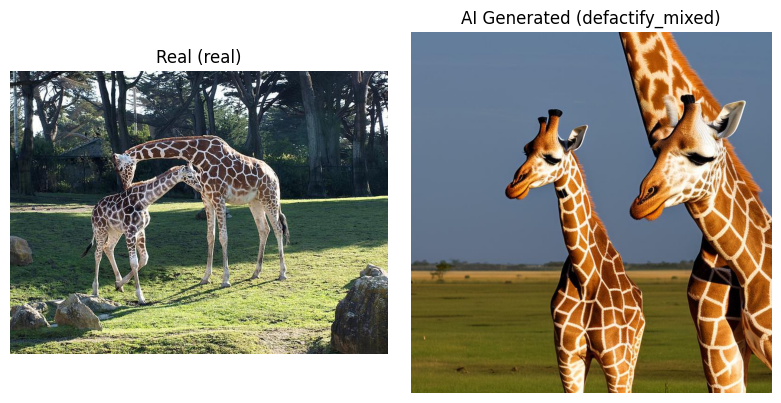

Sanity check complete ✓


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image as PILImage

def load_image(image_path):
    """Unified loader: HF-dataset-indexed (Defactify) or direct file path (Gemini/ChatGPT JPEGs on disk)."""
    image_path = str(image_path)
    if image_path.startswith("defactify_index_"):
        i = int(image_path.split("_")[-1])
        image = ai_df[i]["Image"].convert("RGB")
        return np.array(image)
    else:
        image = PILImage.open(image_path).convert("RGB")
        return np.array(image)

real_sample = df[df.is_forged == 0].iloc[0]
ai_sample   = df[df.is_forged == 1].iloc[0]

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(load_image(real_sample["image_path"]))
axes[0].set_title(f"Real ({real_sample['generator']})")
axes[0].axis("off")

axes[1].imshow(load_image(ai_sample["image_path"]))
axes[1].set_title(f"AI Generated ({ai_sample['generator']})")
axes[1].axis("off")

plt.tight_layout()
plt.savefig("/content/dataset_check.png")
plt.show()
print("Sanity check complete \u2713")

## Imports + device setup

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as transforms
import timm
import numpy as np
import pandas as pd
from PIL import Image
import io
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

Device: cpu


## Dataset Loader

No mask, no forgery-type label — just image + binary label.

In [3]:
class ForgeryDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.skip_count = 0  # visibility into decode failures — check this after each epoch

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        try:
            image = load_image(row["image_path"])  # unified loader: defactify_index_N or direct file path
            image = Image.fromarray(image)

            if self.transform:
                image = self.transform(image)

        except Exception as e:
            self.skip_count += 1
            if self.skip_count <= 5:  # don't spam logs, but don't hide it either
                print(f"[ForgeryDataset] decode failed for {row['image_path']}: {e}")
            image = torch.zeros(3, 224, 224)

        label = torch.tensor(row["is_forged"], dtype=torch.float32)

        return image, label

## Model Architecture

**Binary classifier only.** `type_head` and `seg_head` removed — there is no forgery-type label or mask in the Defactify-only dataset, so those heads had nothing to learn from anyway.

In [18]:
BACKBONE_NAME = "efficientnet_b4"
# Other options: "resnet50d", "convnext_small", "swin_small_patch4_window7_224"

class ForgeryDetector(nn.Module):
    def __init__(self, backbone_name=BACKBONE_NAME):
        super().__init__()

        self.backbone = timm.create_model(
            backbone_name,
            pretrained=True,
            features_only=True,
        )

        with torch.no_grad():
            dummy    = torch.zeros(1, 3, 224, 224)
            features = self.backbone(dummy)
            channels = features[-1].shape[1]
            print(f"Backbone        : {backbone_name}")
            print(f"Output channels : {channels}")

        # ELA branch — still useful for AI-generated detection (compression/artifact cues)
        self.ela_conv = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(),
            nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),
        )

        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier  = nn.Sequential(
            nn.Flatten(),
            nn.Linear(channels + 64, 512), nn.BatchNorm1d(512),
            nn.ReLU(), nn.Dropout(0.4),
            nn.Linear(512, 256), nn.ReLU(), nn.Dropout(0.3),
            nn.Linear(256, 1)  # logit -> sigmoid -> real / ai_generated
        )

    def compute_ela(self, x, quality=90):
        ela_imgs = []
        for img in x:
            try:
                img_np = (img.permute(1, 2, 0).cpu().float().numpy() * 255).astype(np.uint8)
                pil_img = Image.fromarray(img_np)
                buf = io.BytesIO()
                pil_img.save(buf, format="JPEG", quality=quality)
                buf.seek(0)
                recompressed = np.array(Image.open(buf)).astype(np.float32)
                ela = np.abs(img_np.astype(np.float32) - recompressed)
                if ela.max() > 0:
                    ela = ela / ela.max()
                ela_imgs.append(torch.tensor(ela).permute(2, 0, 1).float())
            except Exception:
                ela_imgs.append(torch.zeros(3, 224, 224))
        return torch.stack(ela_imgs).to(x.device)

    def forward(self, x):
        features  = self.backbone(x)
        last_feat = features[-1]

        ela      = self.compute_ela(x)
        ela_feat = self.ela_conv(ela)

        pooled   = self.global_pool(last_feat)
        pooled   = pooled.view(pooled.size(0), -1)
        combined = torch.cat([pooled, ela_feat], dim=1)

        cls_out = self.classifier(combined).squeeze(1)
        return cls_out


import gc
gc.collect()
torch.cuda.empty_cache()

model = ForgeryDetector(BACKBONE_NAME).to(DEVICE)
print(f"\nModel ready \u2713")
print(f"Parameters : {sum(p.numel() for p in model.parameters()):,}")
# ----------------------------------------------------------------------------------
#NEW ELA FIXED
# ----------------------------------------------------------------------------
# BACKBONE_NAME = "efficientnet_b4"
# # Other options: "resnet50d", "convnext_small", "swin_small_patch4_window7_224"

# class ForgeryDetector(nn.Module):
#     def __init__(self, backbone_name=BACKBONE_NAME):
#         super().__init__()

#         self.backbone = timm.create_model(
#             backbone_name,
#             pretrained=True,
#             features_only=True,
#         )

#         with torch.no_grad():
#             dummy    = torch.zeros(1, 3, 224, 224)
#             features = self.backbone(dummy)
#             channels = features[-1].shape[1]
#             print(f"Backbone        : {backbone_name}")
#             print(f"Output channels : {channels}")

#         # ELA branch — still useful for AI-generated detection (compression/artifact cues)
#         self.ela_conv = nn.Sequential(
#             nn.Conv2d(3, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(),
#             nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(),
#             nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),
#         )

#         self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
#         self.classifier  = nn.Sequential(
#             nn.Flatten(),
#             nn.Linear(channels + 64, 512), nn.BatchNorm1d(512),
#             nn.ReLU(), nn.Dropout(0.4),
#             nn.Linear(512, 256), nn.ReLU(), nn.Dropout(0.3),
#             nn.Linear(256, 1)  # logit -> sigmoid -> real / ai_generated
#         )

#     def compute_ela(self, x, normalize_quality=85, probe_quality=90):
#         """
#         FIX: previously this computed ELA directly on whatever compression history
#         the input tensor already carried. Since training sources have very different
#         prior compression histories (Defactify vs Twitter-scraped gpt-image-2 vs
#         nano-banana vs camera/WhatsApp photos), the model learned "amount of prior
#         recompression" as a proxy for "AI-generated" — not actual generative artifacts.
#         Fix: force every image through ONE identical normalize_quality JPEG pass
#         FIRST, stripping prior history, THEN compute ELA against that baseline.
#         """
#         ela_imgs = []
#         for img in x:
#             try:
#                 img_np = (img.permute(1, 2, 0).cpu().float().numpy() * 255).astype(np.uint8)
#                 pil_img = Image.fromarray(img_np)

#                 # Step 1: normalize — strip prior compression history to a fixed baseline
#                 norm_buf = io.BytesIO()
#                 pil_img.save(norm_buf, format="JPEG", quality=normalize_quality)
#                 norm_buf.seek(0)
#                 normalized = Image.open(norm_buf).convert("RGB")
#                 normalized_np = np.array(normalized).astype(np.float32)

#                 # Step 2: probe — re-save the NORMALIZED image, measure new inconsistency only
#                 probe_buf = io.BytesIO()
#                 normalized.save(probe_buf, format="JPEG", quality=probe_quality)
#                 probe_buf.seek(0)
#                 recompressed = np.array(Image.open(probe_buf)).astype(np.float32)

#                 ela = np.abs(normalized_np - recompressed)
#                 if ela.max() > 0:
#                     ela = ela / ela.max()
#                 ela_imgs.append(torch.tensor(ela).permute(2, 0, 1).float())
#             except Exception:
#                 ela_imgs.append(torch.zeros(3, 224, 224))
#         return torch.stack(ela_imgs).to(x.device)

#     def forward(self, x):
#         features  = self.backbone(x)
#         last_feat = features[-1]

#         ela      = self.compute_ela(x)
#         ela_feat = self.ela_conv(ela)

#         pooled   = self.global_pool(last_feat)
#         pooled   = pooled.view(pooled.size(0), -1)
#         combined = torch.cat([pooled, ela_feat], dim=1)

#         cls_out = self.classifier(combined).squeeze(1)
#         return cls_out


# import gc
# gc.collect()
# torch.cuda.empty_cache()

# model = ForgeryDetector(BACKBONE_NAME).to(DEVICE)
# print(f"\nModel ready ✓")
# print(f"Parameters : {sum(p.numel() for p in model.parameters()):,}")

Backbone        : efficientnet_b4
Output channels : 448

Model ready ✓
Parameters : 17,157,065


## Transforms + Train/Val Split + DataLoaders

In [ ]:
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.2, hue=0.1),
    transforms.RandomGrayscale(p=0.05),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

df = pd.read_csv("/content/master_labels.csv")
print(df["is_forged"].value_counts())
print(f"\nPer-generator counts:\n{df['generator'].value_counts()}")

# Stratify by generator (not just is_forged) so sparse generators (Gemini, ChatGPT)
# don't get accidentally concentrated entirely in train or entirely in val.
# NOTE: if any single generator has too few rows for stratified splitting
# (sklearn needs at least 2 per class for test_size=0.15 on small counts),
# this will raise — check df['generator'].value_counts() above before running.
train_df, val_df = train_test_split(
    df, test_size=0.15,
    stratify=df["generator"],
    random_state=42
)

train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)

print(f"\nTrain : {len(train_df)}")
print(f"Val   : {len(val_df)}")
print(f"\nVal distribution (is_forged):\n{val_df['is_forged'].value_counts()}")
print(f"\nVal distribution (generator):\n{val_df['generator'].value_counts()}")

train_dataset = ForgeryDataset(train_df, transform=transform_train)
val_dataset   = ForgeryDataset(val_df,   transform=transform_val)

train_loader = DataLoader(
    train_dataset, batch_size=16, shuffle=True,
    num_workers=2, pin_memory=True, drop_last=True
)
val_loader = DataLoader(
    val_dataset, batch_size=16, shuffle=False,  # MUST stay False — eval cell aligns predictions to val_df by position
    num_workers=2, pin_memory=True
)

print(f"\nTrain batches : {len(train_loader)}")
print(f"Val batches   : {len(val_loader)}")

FileNotFoundError: [Errno 2] No such file or directory: '/content/master_labels.csv'

## Training Loop

Single loss term now — no `type_loss`, no `seg_loss`, no masking logic needed.

In [5]:
from torch.cuda.amp import autocast, GradScaler

scaler             = GradScaler()
ACCUMULATION_STEPS = 4

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.85, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        bce   = nn.functional.binary_cross_entropy_with_logits(inputs, targets, reduction="none")
        pt    = torch.exp(-bce)
        focal = self.alpha * (1 - pt) ** self.gamma * bce
        return focal.mean()

cls_criterion = FocalLoss(alpha=0.85, gamma=2.0)


def train_epoch(model, loader, optimizer):
    model.train()
    total_loss, correct, total = 0, 0, 0
    optimizer.zero_grad()

    for i, (images, labels) in enumerate(tqdm(loader, desc="Training")):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        with autocast():
            cls_out = model(images)
            loss = cls_criterion(cls_out, labels) / ACCUMULATION_STEPS

        scaler.scale(loss).backward()

        if (i + 1) % ACCUMULATION_STEPS == 0 or (i + 1) == len(loader):
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        total_loss += loss.item() * ACCUMULATION_STEPS
        preds       = (torch.sigmoid(cls_out) > 0.5).float()
        correct    += (preds == labels).sum().item()
        total      += labels.size(0)

        if i % 50 == 0:
            torch.cuda.empty_cache()

    return total_loss / len(loader), correct / total


def val_epoch(model, loader):
    model.eval()
    total_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Validation"):
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            with autocast():
                cls_out = model(images)
                loss = cls_criterion(cls_out, labels)

            total_loss += loss.item()
            preds       = (torch.sigmoid(cls_out) > 0.5).float()
            correct    += (preds == labels).sum().item()
            total      += labels.size(0)

    return total_loss / len(loader), correct / total

print("Training functions ready \u2713")

Training functions ready ✓


## Optimizer + Scheduler

In [6]:
from torch.optim.lr_scheduler import SequentialLR, LinearLR, CosineAnnealingLR

optimizer = optim.AdamW([
    {"params": model.backbone.parameters(),   "lr": 5e-5},
    {"params": model.classifier.parameters(), "lr": 2e-4},
    {"params": model.ela_conv.parameters(),   "lr": 2e-4},
], weight_decay=1e-4)

warmup_scheduler = LinearLR(optimizer, start_factor=0.1, end_factor=1.0, total_iters=3)
cosine_scheduler = CosineAnnealingLR(optimizer, T_max=15, eta_min=1e-6)

scheduler = SequentialLR(
    optimizer,
    schedulers=[warmup_scheduler, cosine_scheduler],
    milestones=[3]
)

WARMUP_EPOCHS = 3
print("Optimizer + scheduler ready \u2713")

Optimizer + scheduler ready ✓


## Run Training

In [7]:
import gc
import os
from sklearn.metrics import confusion_matrix, classification_report
from google.colab import drive

drive.mount('/content/drive')
os.makedirs("/content/drive/MyDrive/forgery_detection_defactify", exist_ok=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import gc
import os
from sklearn.metrics import confusion_matrix, classification_report
from google.colab import drive

drive.mount('/content/drive')
os.makedirs("/content/drive/MyDrive/forgery_detection_defactify", exist_ok=True)

EPOCHS     = 15
best_val   = 0
patience   = 4
no_improve = 0
history    = []

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch+1}/{EPOCHS}")

    train_loss, train_acc = train_epoch(model, train_loader, optimizer)
    val_loss, val_acc      = val_epoch(model, val_loader)
    scheduler.step()

    print(f"Train loss: {train_loss:.4f}  acc: {train_acc:.4f}")
    print(f"Val   loss: {val_loss:.4f}  acc: {val_acc:.4f}")

    history.append({
        "epoch": epoch + 1, "train_loss": train_loss, "train_acc": train_acc,
        "val_loss": val_loss, "val_acc": val_acc
    })

    if val_acc > best_val:
        best_val   = val_acc
        no_improve = 0
        torch.save(
            model.state_dict(),
            "/content/drive/MyDrive/forgery_detection_defactify/model_weights.pth"
        )
        print(f"  \u2713 New best model saved (val_acc={val_acc:.4f})")
    else:
        no_improve += 1
        if no_improve >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

print(f"\nBest val accuracy: {best_val:.4f}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Epoch 1/15


NameError: name 'train_loader' is not defined

## Evaluation — Confusion Matrix + Classification Report

Evaluating: 100%|██████████| 63/63 [00:16<00:00,  3.87it/s]


              precision    recall  f1-score   support

        Real       0.90      0.84      0.87       375
AI_Generated       0.91      0.94      0.93       625

    accuracy                           0.91      1000
   macro avg       0.90      0.89      0.90      1000
weighted avg       0.90      0.91      0.90      1000



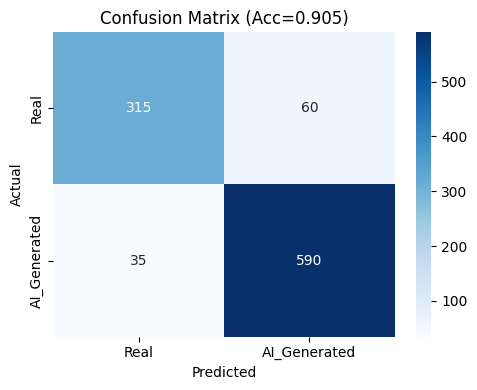


Per-generator accuracy (lowest first — look here for blind spots):
                      n  accuracy
generator                        
real                375     0.840
chatgpt_gpt_image   125     0.920
defactify_mixed     375     0.936
gemini_nano_banana  125     0.992


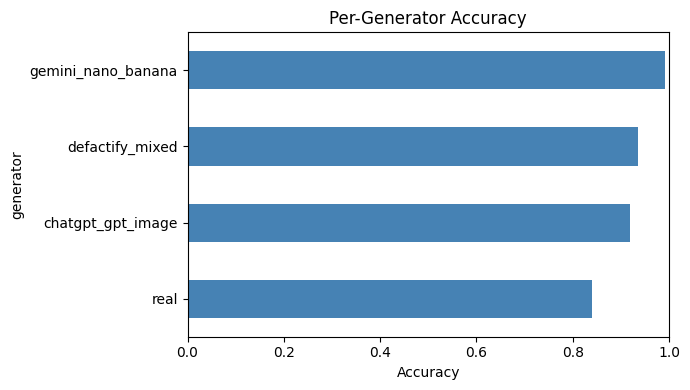

In [ ]:
import seaborn as sns

model.eval()
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Evaluating"):
        images = images.to(DEVICE)
        with autocast():
            cls_out = model(images)
        preds = (torch.sigmoid(cls_out) > 0.5).float().cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Sanity check before trusting positional alignment with val_df['generator']
assert len(all_preds) == len(val_df), (
    f"Mismatch: {len(all_preds)} predictions vs {len(val_df)} val_df rows \u2014 "
    "val_loader shuffle or drop_last likely changed. Do not trust per-generator breakdown below until fixed."
)

cm     = confusion_matrix(all_labels, all_preds)
report = classification_report(
    all_labels, all_preds,
    target_names=["Real", "AI_Generated"],
    output_dict=True
)

print(classification_report(all_labels, all_preds, target_names=["Real", "AI_Generated"]))

fig, ax = plt.subplots(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Real", "AI_Generated"],
            yticklabels=["Real", "AI_Generated"], ax=ax)
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
ax.set_title(f"Confusion Matrix (Acc={report['accuracy']:.3f})")
plt.tight_layout()
plt.savefig("/content/confusion_matrix.png")
plt.show()

# ---- Per-generator accuracy breakdown ----
# This is the number that actually matters — overall accuracy can look fine
# while one generator (e.g. Gemini/ChatGPT) is being missed almost entirely.
results_df = pd.DataFrame({
    "generator": val_df["generator"].values,
    "label":     all_labels,
    "pred":      all_preds,
})
results_df["correct"] = (results_df["label"] == results_df["pred"])

per_gen = results_df.groupby("generator").agg(
    n=("correct", "count"),
    accuracy=("correct", "mean"),
).sort_values("accuracy")

print("\nPer-generator accuracy (lowest first \u2014 look here for blind spots):")
print(per_gen)

fig, ax = plt.subplots(figsize=(7, 4))
per_gen["accuracy"].plot(kind="barh", ax=ax, color="steelblue")
ax.set_xlabel("Accuracy")
ax.set_title("Per-Generator Accuracy")
ax.set_xlim(0, 1)
plt.tight_layout()
plt.savefig("/content/per_generator_accuracy.png")
plt.show()

## Load Model For Prediction

In [8]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = ForgeryDetector(BACKBONE_NAME).to(DEVICE)
model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/forgery_detection_defactify/model_weights.pth",
        map_location=DEVICE
    )
)
model.eval()
print("Model loaded \u2713")

Backbone        : efficientnet_b4
Output channels : 448
Model loaded ✓


## Predict Function

No forgery-type output, no segmentation heatmap — binary verdict + confidence only.

In [9]:
from torch.cuda.amp import autocast

def load_image_for_predict(image_path):
    image_path = str(image_path)
    if image_path.startswith("defactify_index_"):
        i = int(image_path.split("_")[-1])
        image = ai_df[i]["Image"].convert("RGB")
        return np.array(image)
    else:
        import cv2
        image = cv2.imread(image_path)
        if image is None:
            raise FileNotFoundError(f"Image not found: {image_path}")
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


def predict(image_path, threshold=0.50):
    import cv2

    image_rgb = load_image_for_predict(image_path)
    image_rgb = cv2.resize(image_rgb, (224, 224))

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    tensor = transform(Image.fromarray(image_rgb)).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        with autocast():
            cls_out = model(tensor)

    confidence = float(torch.sigmoid(cls_out).item())
    confidence = max(0.0, min(1.0, confidence))
    is_ai      = confidence > threshold

    result_text  = "AI GENERATED" if is_ai else "REAL"
    result_color = "red" if is_ai else "green"

    plt.figure(figsize=(5, 5))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(f"{result_text}  |  Confidence: {confidence:.2%}", color=result_color, fontweight="bold")
    plt.tight_layout()
    plt.savefig("/content/prediction_result.png")
    plt.show()

    print(f"\n{'='*40}")
    print(f"  Result     : {result_text}")
    print(f"  Confidence : {confidence:.2%}")
    print(f"{'='*40}")

    return {"is_ai_generated": is_ai, "confidence": confidence}

## Test With Your Own Uploaded Image

Saving ChatGPT Image_enhance.png to ChatGPT Image_enhance.png
testing uploaded image: ChatGPT Image_enhance.png


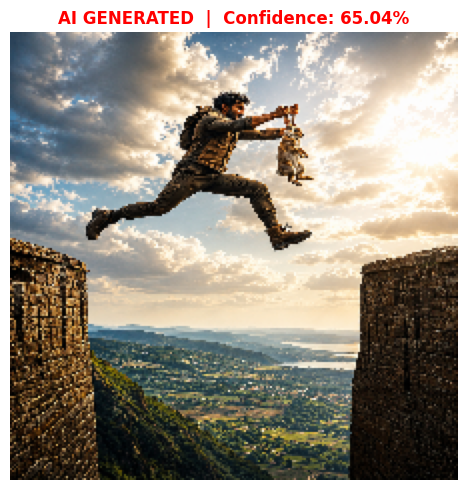


  Result     : AI GENERATED
  Confidence : 65.04%


In [ ]:
from google.colab import files
import matplotlib.pyplot as plt

uploaded = files.upload()
filename = list(uploaded.keys())[0]
print(f"testing uploaded image: {filename}")

result = predict(f"/content/{filename}")

In [13]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

img1 = Image.open("/content/Gemini_car.png").convert("RGB")
img2 = Image.open("/content/Gemini_car_enhanced (1).png").convert("RGB")

tensor1 = transform(img1).unsqueeze(0).to(DEVICE)
tensor2 = transform(img2).unsqueeze(0).to(DEVICE)

with torch.no_grad():
    ela1 = model.compute_ela(tensor1)
    ela2 = model.compute_ela(tensor2)

print(f"ELA mean intensity (fresh):    {ela1.mean().item():.4f}")
print(f"ELA mean intensity (enhanced): {ela2.mean().item():.4f}")

ELA mean intensity (fresh):    0.0766
ELA mean intensity (enhanced): 0.0731


## Test On Held-Out Dataset Samples

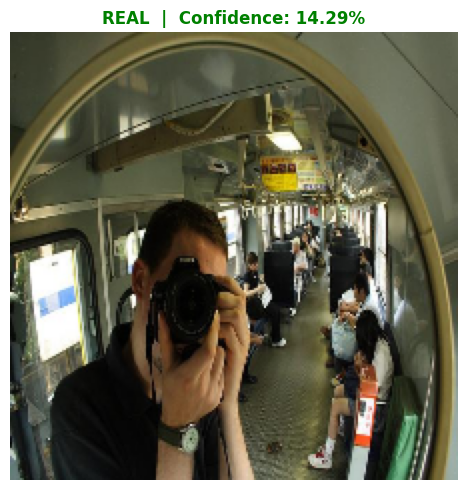


  Result     : REAL
  Confidence : 14.29%



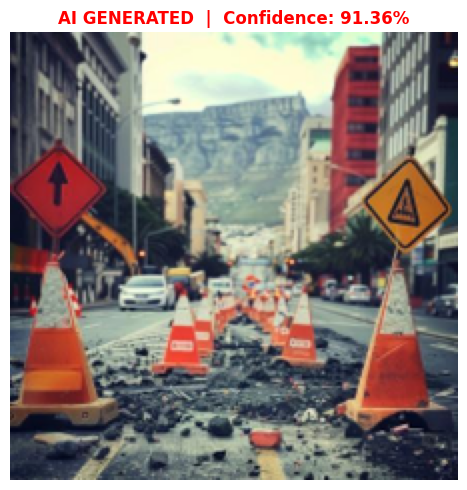


  Result     : AI GENERATED
  Confidence : 91.36%


In [ ]:
real_sample = df[df["is_forged"] == 0].iloc[8]
res1 = predict(real_sample["image_path"])
print("\n" + "="*30)

ai_sample = df[df["is_forged"] == 1].iloc[79]
res2 = predict(ai_sample["image_path"])

Saving ChatGPT Image Jun 23, 2026, 03_53_33 PM (2).png to ChatGPT Image Jun 23, 2026, 03_53_33 PM (2).png
Confirmed filename: ChatGPT Image Jun 23, 2026, 03_53_33 PM (2).png


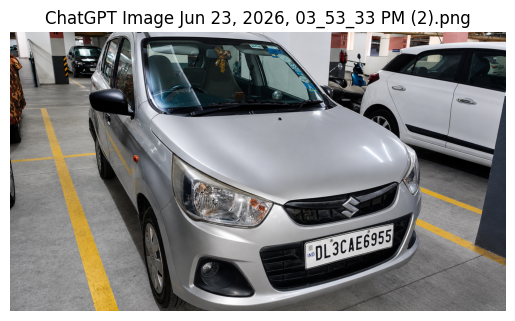

Raw probability AI-generated: 0.1358


In [ ]:
from google.colab import files
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print(f"Confirmed filename: {filename}")

import matplotlib.pyplot as plt
img_check = Image.open(f"/content/{filename}")
plt.imshow(img_check)
plt.title(filename)
plt.axis("off")
plt.show()

import cv2
image_rgb = load_image_for_predict(f"/content/{filename}")
image_rgb = cv2.resize(image_rgb, (224, 224))

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

image_tensor = transform(Image.fromarray(image_rgb)).unsqueeze(0).to(DEVICE)
prob = torch.sigmoid(model(image_tensor))
print(f"Raw probability AI-generated: {prob.item():.4f}")